In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import scipy.stats as sp
import statsmodels.formula.api as smf
import statsmodels.api as sm
import seaborn as sns
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from itertools import chain, combinations
from scipy.stats import kstest,jarque_bera
from statsmodels.stats.diagnostic import het_breuschpagan
%config InlineBackend.figure_format = 'retina'

In [2]:
df = pd.read_csv('SeoulBikeData1.csv' )
df.columns= ['Date', 'Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity',
       'Wind_speed', 'Visibility', 'Dew_point_temperature',
       'Solar_Radiation', 'Rainfall', 'Snowfall', 'Seasons',
       'Holiday', 'Functioning_Day']

> This is the publicly available for bike rentals in Seoul

> Our objective is to predict the rented bike count given the weather conditions of the day

In [3]:
# Collecting only Functioning day data
df = df[df['Functioning_Day'] == 'Yes']

In [4]:
print(df.shape)
print(df.dtypes)

(8465, 14)
Date                      object
Rented_Bike_Count          int64
Hour                       int64
Temperature              float64
Humidity                   int64
Wind_speed               float64
Visibility                 int64
Dew_point_temperature    float64
Solar_Radiation          float64
Rainfall                 float64
Snowfall                 float64
Seasons                   object
Holiday                   object
Functioning_Day           object
dtype: object


In [7]:
min(df['Date']),max(df['Date'])
#Need to change into proper data formats

('01/01/2018', '31/12/2017')

In [8]:
df['Hour'] = df['Hour'].astype('category')
df['Date'] = pd.to_datetime(df["Date"], format='%d/%m/%Y')

In [9]:
print(max(df['Date']), min(df['Date']))

2018-11-30 00:00:00 2017-12-01 00:00:00


In [10]:
df['Day'] = df['Date'].dt.day_name()

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8465 entries, 0 to 8759
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Date                   8465 non-null   datetime64[ns]
 1   Rented_Bike_Count      8465 non-null   int64         
 2   Hour                   8465 non-null   category      
 3   Temperature            8465 non-null   float64       
 4   Humidity               8465 non-null   int64         
 5   Wind_speed             8465 non-null   float64       
 6   Visibility             8465 non-null   int64         
 7   Dew_point_temperature  8465 non-null   float64       
 8   Solar_Radiation        8465 non-null   float64       
 9   Rainfall               8465 non-null   float64       
 10  Snowfall               8465 non-null   float64       
 11  Seasons                8465 non-null   object        
 12  Holiday                8465 non-null   object        
 13  Fun

In [12]:
# All 24 hours per day data of year 2018
df['Date'].value_counts()

2017-12-01    24
2017-12-02    24
2018-07-31    24
2018-07-30    24
2018-07-29    24
              ..
2018-03-25    24
2018-03-24    24
2018-03-23    24
2018-11-30    24
2018-10-06    17
Name: Date, Length: 353, dtype: int64

In [13]:
df['Functioning_Day'].value_counts()

Yes    8465
Name: Functioning_Day, dtype: int64

In [15]:
df.describe()

,Rented_Bike_Count,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall
count,8465.000000,8465.000000,8465.000000,8465.000000,8465.000000,8465.000000,8465.000000,8465.00000,8465.000000
mean,729.156999,12.771057,58.147194,1.725883,1433.873479,3.944997,0.567868,0.14912,0.077685
std,642.351166,12.104375,20.484839,1.034281,609.051229,13.242399,0.868245,1.12554,0.444063
min,2.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.00000,0.000000
25%,214.000000,3.000000,42.000000,0.900000,935.000000,-5.100000,0.000000,0.00000,0.000000
50%,542.000000,13.500000,57.000000,1.500000,1690.000000,4.700000,0.010000,0.00000,0.000000
75%,1084.000000,22.700000,74.000000,2.300000,2000.000000,15.200000,0.930000,0.00000,0.000000
max,3556.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.00000,8.800000


Tentative steps ahead:

- EDA:
    - Scatters to get an initial sense of if linear relation exists
    - Ranges of response variable
    - Ranges of independent predictors
    - Check for multicollinearity, influential points
- Model:
    - Do we need preprocessing : Scaling
    - After fit, normality, heteroscedasticity
    - Main metrics (R squared, F test, significant predictors, Prediction error on test data)


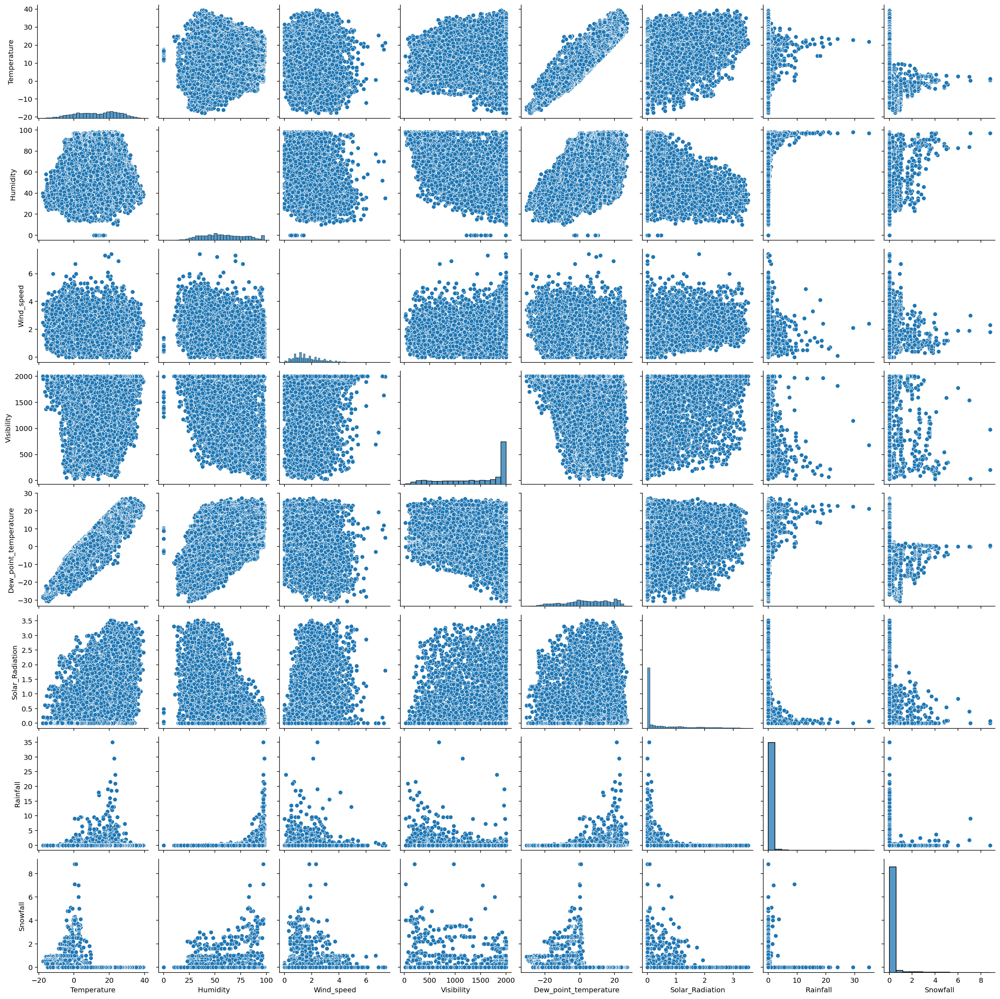

In [16]:
sns.pairplot(df[['Hour', 'Temperature', 'Humidity','Wind_speed', 'Visibility', 'Dew_point_temperature', \
                 'Solar_Radiation', 'Rainfall', 'Snowfall', 'Seasons','Holiday', 'Functioning_Day']])



Inferences:
- Temperature and dew point temperature are correlated
- Humidity and dew point temperature have some correlation too
- Solar radiation and hour seem to have minor correlation too

In [17]:
# checking correlations further
df[['Temperature','Dew_point_temperature','Humidity','Solar_Radiation', 'Rainfall', 'Hour','Wind_speed','Snowfall','Visibility']].corr()

,Temperature,Dew_point_temperature,Humidity,Solar_Radiation,Rainfall,Wind_speed,Snowfall,Visibility
Temperature,1.000000,0.914467,0.166425,0.354844,0.052149,-0.038481,-0.217746,0.028262
Dew_point_temperature,0.914467,1.000000,0.539402,0.098525,0.126812,-0.177170,-0.149760,-0.182586
Humidity,0.166425,0.539402,1.000000,-0.457273,0.236917,-0.337352,0.110127,-0.548542
Solar_Radiation,0.354844,0.098525,-0.457273,1.000000,-0.074157,0.326222,-0.073380,0.153046
Rainfall,0.052149,0.126812,0.236917,-0.074157,1.000000,-0.024931,0.008604,-0.170352
Wind_speed,-0.038481,-0.177170,-0.337352,0.326222,-0.024931,1.000000,-0.003789,0.180428
Snowfall,-0.217746,-0.149760,0.110127,-0.073380,0.008604,-0.003789,1.000000,-0.122860
Visibility,0.028262,-0.182586,-0.548542,0.153046,-0.170352,0.180428,-0.122860,1.000000


##### VIF checks

In [18]:
print(len(df.columns))
df.columns

15


Index(['Date', 'Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity',
       'Wind_speed', 'Visibility', 'Dew_point_temperature', 'Solar_Radiation',
       'Rainfall', 'Snowfall', 'Seasons', 'Holiday', 'Functioning_Day', 'Day'],
      dtype='object')

In [19]:
# VIF
y, X = dmatrices('Rented_Bike_Count ~ Hour+Temperature+Humidity+Wind_speed+Visibility+Dew_point_temperature+Solar_Radiation+Holiday+Seasons+Rainfall+Snowfall+Functioning_Day+Day', data=df,\
                 return_type='dataframe')

vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["features"] = X.columns
print(vif)

    VIF Factor               features
0   465.864339              Intercept
1     1.919072              Hour[T.1]
2     1.921974              Hour[T.2]
3     1.924417              Hour[T.3]
4     1.925657              Hour[T.4]
5     1.931349              Hour[T.5]
6     1.934273              Hour[T.6]
7     1.939552              Hour[T.7]
8     1.963692              Hour[T.8]
9     2.053393              Hour[T.9]
10    2.215740             Hour[T.10]
11    2.396120             Hour[T.11]
12    2.535374             Hour[T.12]
13    2.584212             Hour[T.13]
14    2.513083             Hour[T.14]
15    2.394043             Hour[T.15]
16    2.235283             Hour[T.16]
17    2.102409             Hour[T.17]
18    2.015630             Hour[T.18]
19    1.972688             Hour[T.19]
20    1.954064             Hour[T.20]
21    1.935204             Hour[T.21]
22    1.923944             Hour[T.22]
23    1.920409             Hour[T.23]
24    1.030476  Holiday[T.No Holiday]
25    1.7467

- As we have seen in corr plots to Dew_point_temperature has strong correlation with temperature, lets remove that and check

In [306]:
y, X = dmatrices('Rented_Bike_Count ~ Hour+Temperature+Humidity+Wind_speed+Visibility+Solar_Radiation+Holiday+Seasons+Rainfall+Snowfall+Functioning_Day+Day', data=df,\
                 return_type='dataframe')

vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["features"] = X.columns
print(vif)

    VIF Factor               features
0   116.168120              Intercept
1     1.919067              Hour[T.1]
2     1.921967              Hour[T.2]
3     1.924386              Hour[T.3]
4     1.925596              Hour[T.4]
5     1.931207              Hour[T.5]
6     1.934256              Hour[T.6]
7     1.939069              Hour[T.7]
8     1.962755              Hour[T.8]
9     2.048759              Hour[T.9]
10    2.209828             Hour[T.10]
11    2.391461             Hour[T.11]
12    2.533205             Hour[T.12]
13    2.584167             Hour[T.13]
14    2.511624             Hour[T.14]
15    2.390501             Hour[T.15]
16    2.229601             Hour[T.16]
17    2.098287             Hour[T.17]
18    2.013616             Hour[T.18]
19    1.971816             Hour[T.19]
20    1.954017             Hour[T.20]
21    1.935201             Hour[T.21]
22    1.923918             Hour[T.22]
23    1.920374             Hour[T.23]
24    1.030471  Holiday[T.No Holiday]
25    1.7446

These show correlation
High
- Temp, dew point
Medium
- Dew point, humidity
- humidity, visibility
- Humidity, solar radiation
Low
- Humidity, Rainfall
- Humidity, hour
- Wind speed, hour
- Wind speed, humidity
- Wind speed, solar radiation
- Snowfall, temperature


##### Quick trend checks through plots

<AxesSubplot:xlabel='Day'>

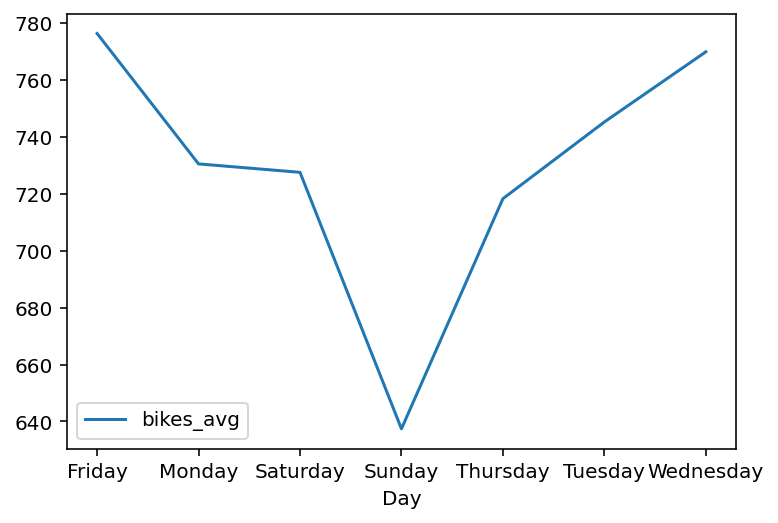

In [22]:

df.groupby(['Day']).agg(bikes_avg=pd.NamedAgg(column='Rented_Bike_Count', aggfunc='mean')).plot()

<AxesSubplot:xlabel='Hour'>

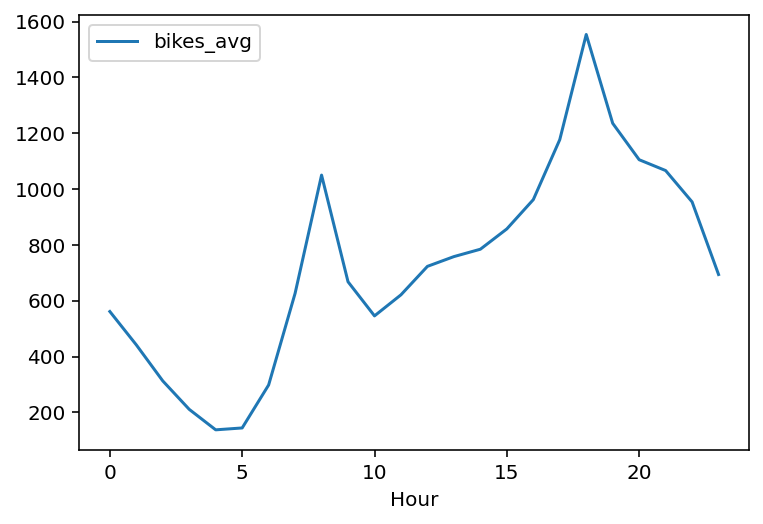

In [23]:
df.groupby(['Hour']).agg(bikes_avg=pd.NamedAgg(column='Rented_Bike_Count', aggfunc='mean')).plot()

<AxesSubplot:xlabel='Temperature'>

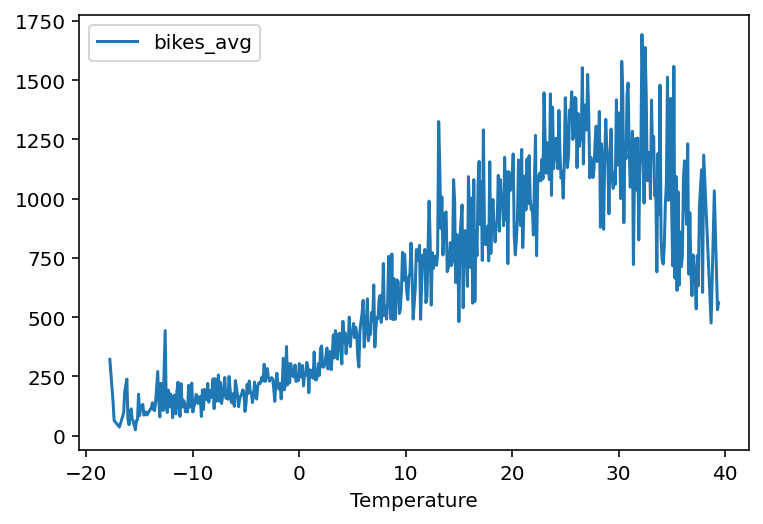

In [24]:
df.groupby(['Temperature']).agg(bikes_avg=pd.NamedAgg(column='Rented_Bike_Count', aggfunc='mean')).plot()

<AxesSubplot:xlabel='Wind_speed'>

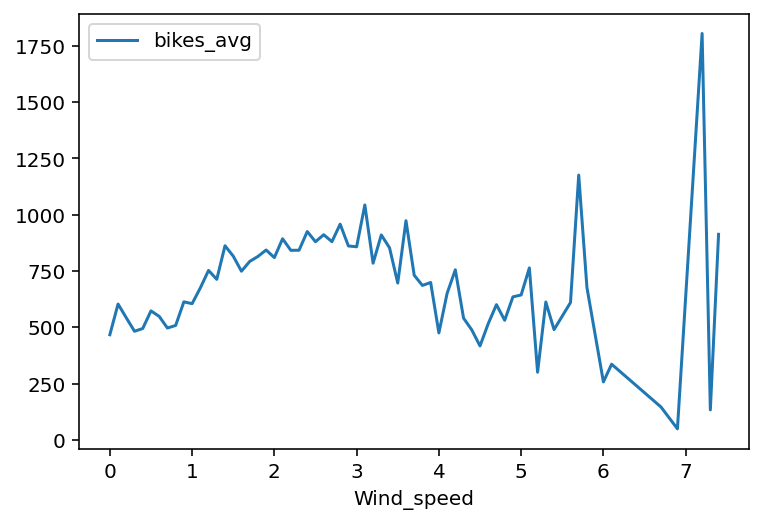

In [25]:
df.groupby(['Wind_speed']).agg(bikes_avg=pd.NamedAgg(column='Rented_Bike_Count', aggfunc='mean')).plot()

<AxesSubplot:xlabel='Solar_Radiation'>

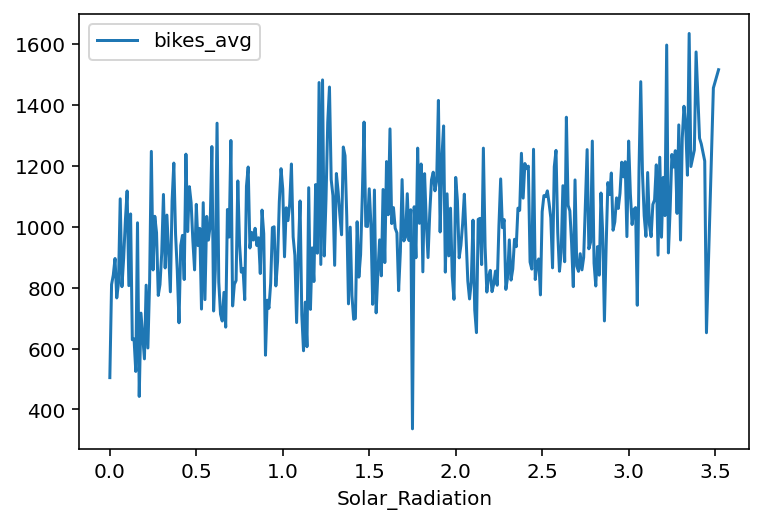

In [26]:
df.groupby(['Solar_Radiation']).agg(bikes_avg=pd.NamedAgg(column='Rented_Bike_Count', aggfunc='mean')).plot()

<AxesSubplot:xlabel='Humidity'>

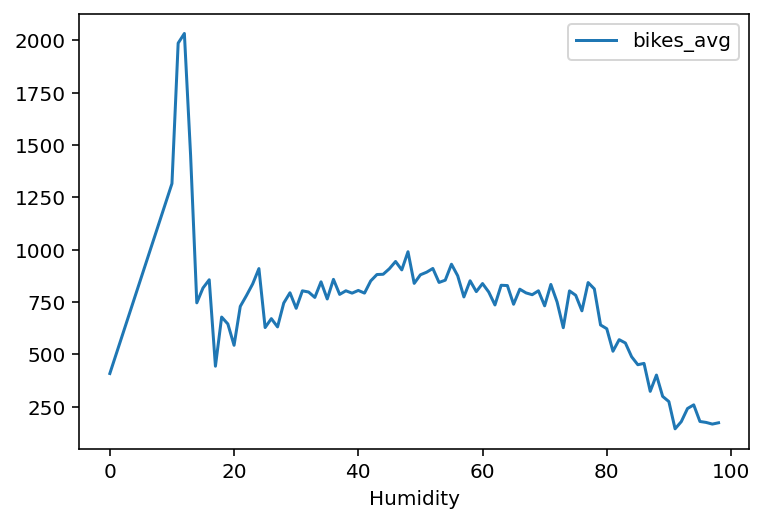

In [27]:
df.groupby(['Humidity']).agg(bikes_avg=pd.NamedAgg(column='Rented_Bike_Count', aggfunc='mean')).plot()

<AxesSubplot:xlabel='Rainfall'>

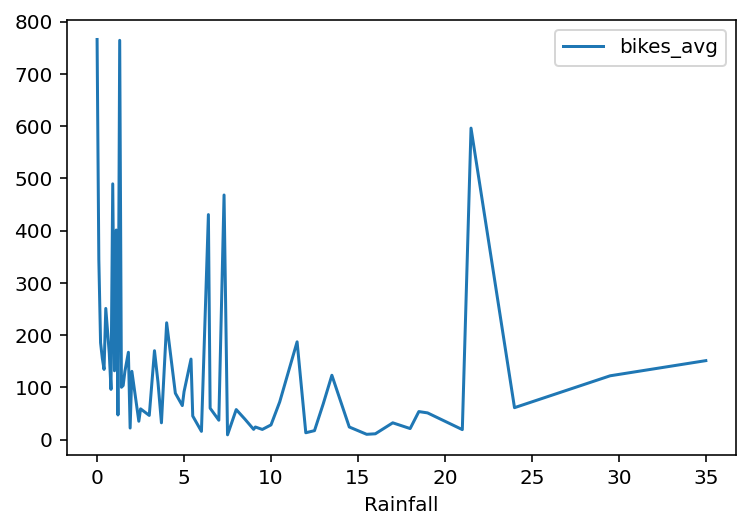

In [28]:
df.groupby(['Rainfall']).agg(bikes_avg=pd.NamedAgg(column='Rented_Bike_Count', aggfunc='mean')).plot()

<AxesSubplot:xlabel='Snowfall'>

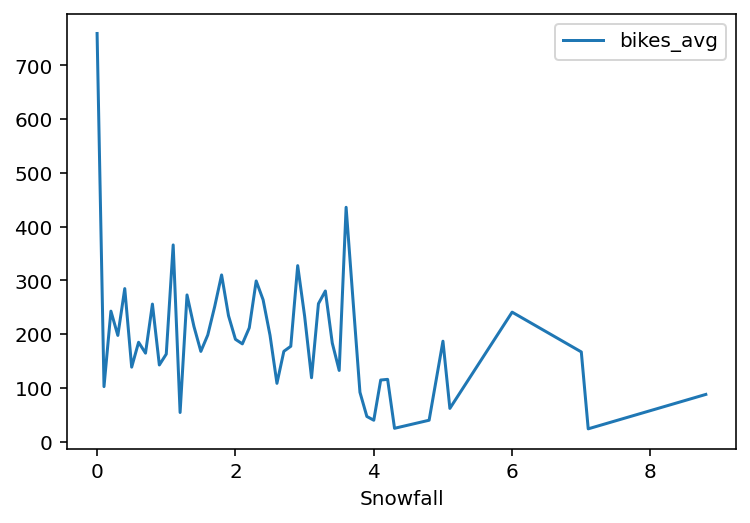

In [29]:
df.groupby(['Snowfall']).agg(bikes_avg=pd.NamedAgg(column='Rented_Bike_Count', aggfunc='mean')).plot()

<AxesSubplot:xlabel='Visibility'>

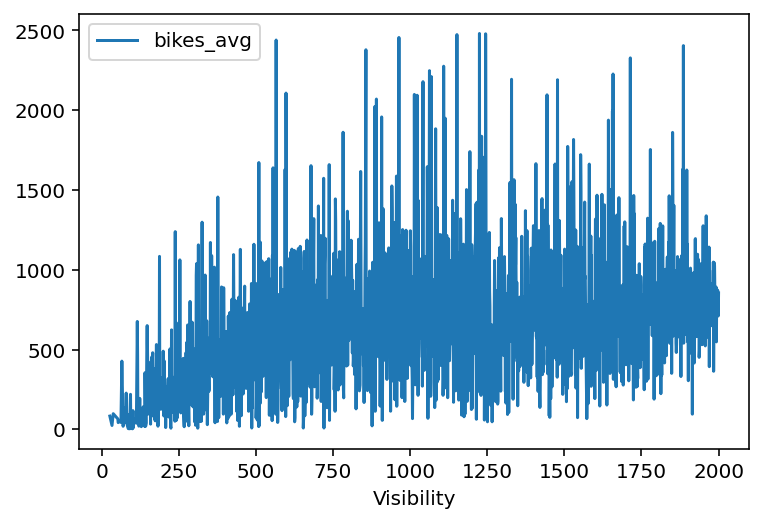

In [30]:
df.groupby(['Visibility']).agg(bikes_avg=pd.NamedAgg(column='Rented_Bike_Count', aggfunc='mean')).plot()

In [31]:
print(min(df['Temperature']))
print(max(df['Temperature']))

print(max(df['Rented_Bike_Count']))
print(min(df['Rented_Bike_Count']))

-17.8
39.4
3556
2


In [32]:
df['Rented_Bike_Count_log'] = np.log(df['Rented_Bike_Count']+1)

## Modeling trails

### Model 1

In [34]:
df.columns

Index(['Date', 'Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity',
       'Wind_speed', 'Visibility', 'Dew_point_temperature', 'Solar_Radiation',
       'Rainfall', 'Snowfall', 'Seasons', 'Holiday', 'Functioning_Day', 'Day',
       'Rented_Bike_Count_log'],
      dtype='object')

In [35]:
# Model 1

feature_cols = ['Hour','Temperature','Humidity','Holiday','Seasons','Wind_speed','Rainfall','Snowfall','Visibility','Solar_Radiation','Day']
#feature_cols = ['Hour','Temperature','Humidity','Holiday','Seasons','Wind_speed','Rainfall','Snowfall','Functioning_Day','Visibility','Solar_Radiation','Day']
response_col = 'Rented_Bike_Count'

print(response_col+'~'+"+".join(feature_cols))



Rented_Bike_Count~Hour+Temperature+Humidity+Holiday+Seasons+Wind_speed+Rainfall+Snowfall+Visibility+Solar_Radiation+Day


In [36]:

X = df[feature_cols]
y = df[response_col]
X_train, X_test, y_train, y_test= train_test_split(X,y, train_size=0.70, random_state=100)


df_train = pd.concat([X_train, y_train], axis=1)
df_test = pd.concat([X_test, y_test], axis=1)

In [37]:
#model = smf.ols('Rented_Bike_Count_log ~ C(Hour)+Temperature + Holiday+Seasons+Wind_speed+Rainfall+Functioning_Day',df_train).fit()

#model = smf.ols('Rented_Bike_Count_log ~ C(Hour)+Temperature + Holiday+Seasons+Rainfall',df_train).fit()

# \ best so far
#model = smf.ols('Rented_Bike_Count_log ~ C(Hour)+Temperature + Holiday+Seasons+Rainfall+Functioning_Day',df_train).fit()
# /

#model = smf.ols('Rented_Bike_Count_log ~ C(Hour)+Temperature+Humidity+Wind_speed+Visibility+Solar_Radiation+Holiday+Seasons+Rainfall+Snowfall+Functioning_Day',df_train).fit()
#model = smf.ols('Rented_Bike_Count_log ~ Hour+Temperature+Humidity+Wind_speed+Visibility+Solar_Radiation+Holiday+Seasons+Rainfall+Snowfall+Functioning_Day',df_train).fit()
#model = smf.ols('scaled_bikecount ~ C(Hour)+Temperature + Holiday+Seasons+Rainfall+Functioning_Day',df_train).fit()

#model = smf.ols('Rented_Bike_Count ~ C(Hour)+Temperature + Holiday+Seasons+Wind_speed+Rainfall+Functioning_Day',df_train).fit()

model = smf.ols(response_col+'~'+"+".join(feature_cols),df_train).fit()
print(model.model.formula)
model.summary()

Rented_Bike_Count~Hour+Temperature+Humidity+Holiday+Seasons+Wind_speed+Rainfall+Snowfall+Visibility+Solar_Radiation+Day


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      Rented_Bike_Count   R-squared:                       0.662
Model:                            OLS   Adj. R-squared:                  0.659
Method:                 Least Squares   F-statistic:                     287.5
Date:                Sun, 29 Jan 2023   Prob (F-statistic):               0.00
Time:                        00:12:59   Log-Likelihood:                -43513.
No. Observations:                5925   AIC:                         8.711e+04
Df Residuals:                    5884   BIC:                         8.738e+04
Df Model:                          40                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept               852.3419     53.016     16.077      0.000     748.411     956.272
Hour[T.1]               -93.1392     33.800     -2.756      0.006    -159.400     -26.878
Hour[T.2]              -211.9807     33.800     -6.272      0.000    -278.242    -145.719
Hour[T.3]              -307.9217     33.681     -9.142      0.000    -373.948    -241.895
Hour[T.4]              -363.5254     34.036    -10.681      0.000    -430.248    -296.803
Hour[T.5]              -333.8430     34.191     -9.764      0.000    -400.871    -266.816
Hour[T.6]              -178.9586     33.242     -5.383      0.000    -244.125    -113.792
Hour[T.7]               136.2462     34.028      4.004      0.000      69.539     202.954
Hour[T.8]               531.9491     33.990     15.650      0.000     465.316     598.582
Hour[T.9]                66.4968     34.580      1.923      0.055      -1.292     134.285
Hour[T.10]             -179.8259     36.092     -4.982      0.000    -250.579    -109.073
Hour[T.11]             -213.0059     38.057     -5.597      0.000    -287.612    -138.400
Hour[T.12]             -151.8118     38.494     -3.944      0.000    -227.274     -76.350
Hour[T.13]             -152.7611     39.920     -3.827      0.000    -231.019     -74.503
Hour[T.14]             -170.6532     38.883     -4.389      0.000    -246.878     -94.428
Hour[T.15]              -92.9436     37.766     -2.461      0.014    -166.979     -18.908
Hour[T.16]               45.6764     36.103      1.265      0.206     -25.099     116.452
Hour[T.17]              314.3970     35.139      8.947      0.000     245.512     383.282
Hour[T.18]              780.6901     34.320     22.747      0.000     713.410     847.971
Hour[T.19]              552.0672     34.515     15.995      0.000     484.405     619.729
Hour[T.20]              445.2825     33.696     13.215      0.000     379.226     511.339
Hour[T.21]              447.8986     33.584     13.337      0.000     382.063     513.735
Hour[T.22]              336.2543     34.182      9.837      0.000     269.244     403.264
Hour[T.23]              112.2959     33.391      3.363      0.001      46.838     177.754
Holiday[T.No Holiday]   117.8048     23.886      4.932      0.000      70.980     164.629
Seasons[T.Spring]      -163.5250     14.763    -11.077      0.000    -192.466    -134.584
Seasons[T.Summer]      -168.8192     18.378     -9.186      0.000    -204.847    -132.792
Seasons[T.Winter]      -363.2102     20.846    -17.424      0.000    -404.075    -322.345
Day[T.Monday]           -44.4371     18.253     -2.434      0.015     -80.220      -8.654
Day[T.Saturday]         -70.9625     18.196     -3.900      0.000    -106.634     -35.291
Day[T.Sunday]          -138.1950     18.176     -7.603      0.000    -173.826    -102.564
Day[T.Thursday]        

In [38]:
# Global F test
(model.fvalue,round(model.f_pvalue,5))

(287.49619309357274, 0.0)

In [39]:
# insignificant predictors
[(model.params.index[i],round(model.pvalues[i],5)) for i in range(len(model.pvalues)) if (model.pvalues[i]>0.05)]

[('Hour[T.9]', 0.05453),
 ('Hour[T.16]', 0.20587),
 ('Day[T.Thursday]', 0.66607),
 ('Day[T.Tuesday]', 0.37141),
 ('Day[T.Wednesday]', 0.84241),
 ('Wind_speed', 0.74431),
 ('Visibility', 0.75384)]

- On full model, 
Visibility isn't seeming significant, 
Snowfall, solar radiation nearly non significant

> Check after wind speed removal

> Influential points check

In [41]:
# getting influence infomation
infl = model.get_influence()

In [42]:
# internal studentised residuals for autocorrelation check
int_stud_resids = infl.resid_studentized_internal

Text(0.5, 1.0, 'Int studentised residuals')

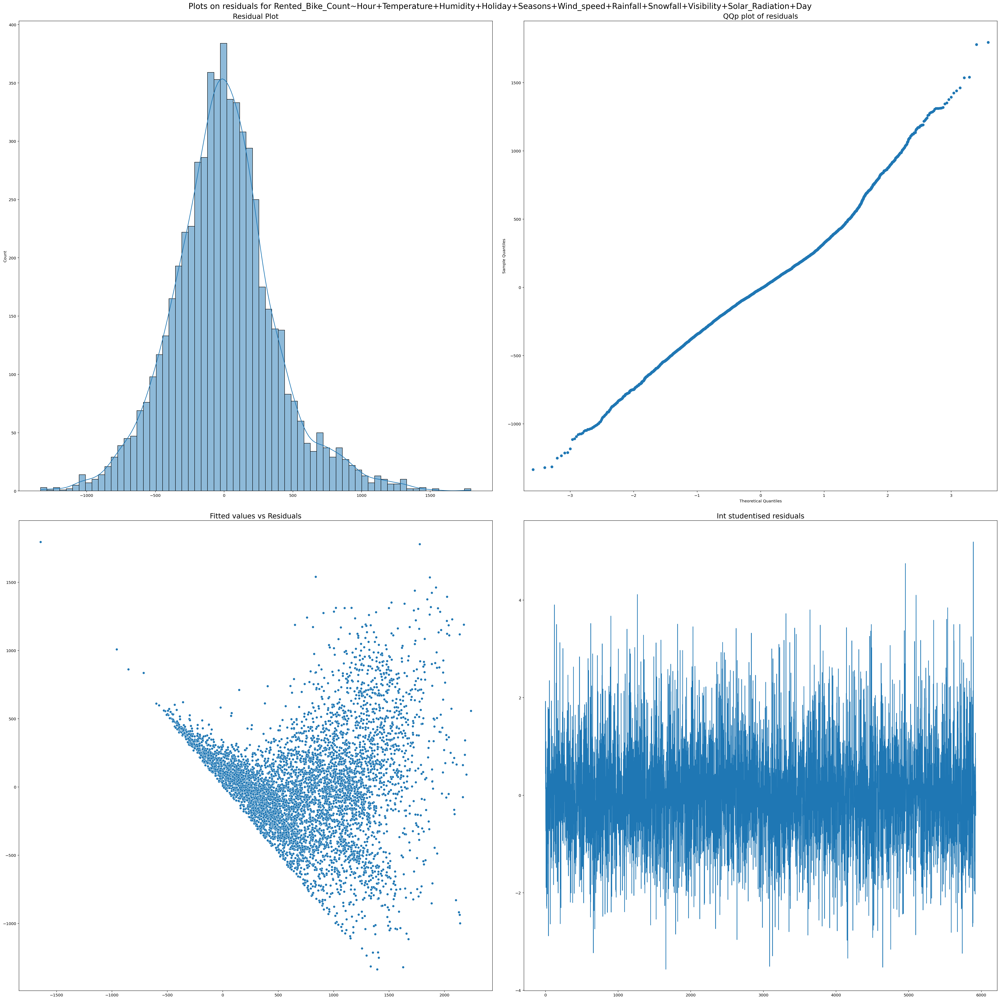

In [43]:
#residual plots check on train data
fig, axes = plt.subplots(2, 2, figsize = (35,35),constrained_layout=True)
fig.suptitle(f'Plots on residuals for {model.model.formula}',size = 20)

sns.histplot(model.resid, kde=True, ax = axes[0,0])
axes[0,0].set_title("Residual Plot", size = 18)

sm.qqplot(model.resid, ax = axes[0,1])
axes[0,1].set_title("QQp plot of residuals", size = 18)

sns.scatterplot(x = model.fittedvalues, y = model.resid, ax = axes[1,0])
axes[1,0].set_title("Fitted values vs Residuals", size = 18)

axes[1,1].plot(int_stud_resids)
axes[1,1].set_title("Int studentised residuals", size = 18)

In [44]:
#Breusch-Pagan for Heteroskedasticity

bp_test = het_breuschpagan(model.resid, model.model.exog)
labels = ['LM Statistic', 'LM-Test p-value']
print(dict(zip(labels, bp_test)))

print(bp_test[1]) # less than 0.05 implies heterscedasticty is present

{'LM Statistic': 1603.7623789524414, 'LM-Test p-value': 7.0928516994003e-311}
7.0928516994003e-311


In [45]:
jarque_bera(model.resid).pvalue # less than 0.05 normality is not present

0.0

In [46]:
# On train data, predictions from the model
preds_train = model.predict(df_train)

In [47]:
# model wrongly predicts responses to be negative
min(preds_train)


-1644.6421967412314

In [48]:
# On train data, predictions from the model
preds_train = model.predict(df_train)

# RMSE _ train data
print(np.sqrt(mean_squared_error(y_train, preds_train)))

# Rsquared _ train data
r_squared = r2_score(y_train, preds_train)
print(r_squared)

# Rsquared _ train data
# after setting the lowest prediction to be zero, eliminating negative bike count preds
r_squared = r2_score(y_train, [i if i>=0 else 0 for i in preds_train])
print(r_squared)


374.313975322921
0.6615248767990751
0.6804490852627204


In [49]:
model.rsquared
# quick check, matches

0.6615248767990751

In [50]:
# Test data predictions

preds_test = model.predict(df_test)
preds_test.head(10)

937      -16.726544
6769     816.783798
6928    1022.963358
775      159.738597
3790    1058.379045
3786    1991.604504
5252    1417.204134
4510     971.473609
6516     836.094715
522      940.397879
dtype: float64

In [51]:
# On test data, predictions from the model
preds_test = model.predict(df_test)

# RMSE _ train data
print(np.sqrt(mean_squared_error(y_test, preds_test)))

# Rsquared _ train data
r_squared = r2_score(y_test, preds_test)
print(r_squared)

# Rsquared _ train data
# after setting the lowest prediction to be zero, eliminating negative bike count preds
r_squared = r2_score(y_test, [i if i>=0 else 0 for i in preds_test])
print(r_squared)


365.22859032116656
0.6740654248635536
0.6944346995041405


In [52]:
# ANOVA type = 1
anova_table = sm.stats.anova_lm(model, typ=1)
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
Hour,23.0,7.634296e+08,3.319259e+07,235.262863,0.000000e+00
Holiday,1.0,1.062923e+07,1.062923e+07,75.337962,5.070026e-18
Seasons,3.0,5.584292e+08,1.861431e+08,1319.347139,0.000000e+00
Day,6.0,1.165769e+07,1.942949e+06,13.771256,1.327302e-15
Temperature,1.0,1.003409e+08,1.003409e+08,711.197574,5.115115e-148
Humidity,1.0,1.422122e+08,1.422122e+08,1007.973378,2.536503e-204
Wind_speed,1.0,1.597036e+04,1.597036e+04,0.113195,7.365477e-01
Rainfall,1.0,3.108636e+07,3.108636e+07,220.334323,5.827486e-49
Snowfall,1.0,1.216872e+06,1.216872e+06,8.624961,3.328729e-03
Visibility,1.0,7.406461e+02,7.406461e+02,0.005250,9.422432e-01


In [53]:
# ANOVA type = 2
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
Hour,4.830155e+08,23.0,148.848825,0.000000e+00
Holiday,3.431954e+06,1.0,24.325046,8.360970e-07
Seasons,6.576500e+07,3.0,155.376664,6.473582e-97
Day,1.332737e+07,6.0,15.743652,5.048674e-18
Temperature,9.194813e+07,1.0,651.711095,2.006615e-136
Humidity,4.556312e+07,1.0,322.942839,2.444986e-70
Wind_speed,1.500938e+04,1.0,0.106384,7.443111e-01
Rainfall,2.958189e+07,1.0,209.670920,1.022533e-46
Snowfall,1.007701e+06,1.0,7.142399,7.548995e-03
Visibility,1.387516e+04,1.0,0.098345,7.538365e-01


In [54]:
# Insignificant predictors as per partial F test
list(anova_table[anova_table['PR(>F)']>0.05].index)

['Wind_speed', 'Visibility']

In [55]:
print(model.aic, model.bic)

87108.79679300747 87382.9611676136


### Model 2

--- Looking at the residual plots,  noticed normality isn't satisfied and heteroscedisticity is present as funnel kind of shape in residual plot. So trying log transformation on response now

In [56]:
feature_cols = ['Hour','Temperature','Humidity','Holiday','Seasons','Wind_speed','Rainfall','Snowfall','Visibility','Solar_Radiation','Day']
#feature_cols = ['Hour','Temperature','Humidity','Holiday','Seasons','Wind_speed','Rainfall','Snowfall','Functioning_Day','Visibility','Solar_Radiation','Day']
response_col = 'Rented_Bike_Count_log'

print(response_col+'~'+"+".join(feature_cols))



Rented_Bike_Count_log~Hour+Temperature+Humidity+Holiday+Seasons+Wind_speed+Rainfall+Snowfall+Visibility+Solar_Radiation+Day


In [57]:
df.columns

Index(['Date', 'Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity',
       'Wind_speed', 'Visibility', 'Dew_point_temperature', 'Solar_Radiation',
       'Rainfall', 'Snowfall', 'Seasons', 'Holiday', 'Functioning_Day', 'Day',
       'Rented_Bike_Count_log'],
      dtype='object')

In [58]:
X = df[feature_cols]
y = df[response_col]
X_train, X_test, y_train, y_test= train_test_split(X,y, train_size=0.70, random_state=100)


df_train = pd.concat([X_train, y_train], axis=1)
df_test = pd.concat([X_test, y_test], axis=1)

In [59]:
model = smf.ols(response_col+'~'+"+".join(feature_cols),df_train).fit()
print(model.model.formula)
model.summary()

Rented_Bike_Count_log~Hour+Temperature+Humidity+Holiday+Seasons+Wind_speed+Rainfall+Snowfall+Visibility+Solar_Radiation+Day


<class 'statsmodels.iolib.summary.Summary'>
"""
                              OLS Regression Results                             
=================================================================================
Dep. Variable:     Rented_Bike_Count_log   R-squared:                       0.712
Model:                               OLS   Adj. R-squared:                  0.710
Method:                    Least Squares   F-statistic:                     363.3
Date:                   Sun, 29 Jan 2023   Prob (F-statistic):               0.00
Time:                           00:18:43   Log-Likelihood:                -5612.5
No. Observations:                   5925   AIC:                         1.131e+04
Df Residuals:                       5884   BIC:                         1.158e+04
Df Model:                             40                                         
Covariance Type:               nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                 6.8650      0.088     77.682      0.000       6.692       7.038
Hour[T.1]                -0.1761      0.056     -3.126      0.002      -0.287      -0.066
Hour[T.2]                -0.5014      0.056     -8.899      0.000      -0.612      -0.391
Hour[T.3]                -0.8766      0.056    -15.614      0.000      -0.987      -0.767
Hour[T.4]                -1.2720      0.057    -22.421      0.000      -1.383      -1.161
Hour[T.5]                -1.1959      0.057    -20.983      0.000      -1.308      -1.084
Hour[T.6]                -0.5453      0.055     -9.840      0.000      -0.654      -0.437
Hour[T.7]                 0.0779      0.057      1.373      0.170      -0.033       0.189
Hour[T.8]                 0.5810      0.057     10.255      0.000       0.470       0.692
Hour[T.9]                 0.1574      0.058      2.730      0.006       0.044       0.270
Hour[T.10]               -0.2275      0.060     -3.782      0.000      -0.345      -0.110
Hour[T.11]               -0.2627      0.063     -4.140      0.000      -0.387      -0.138
Hour[T.12]               -0.1702      0.064     -2.653      0.008      -0.296      -0.044
Hour[T.13]               -0.1552      0.067     -2.333      0.020      -0.286      -0.025
Hour[T.14]               -0.2247      0.065     -3.467      0.001      -0.352      -0.098
Hour[T.15]               -0.1608      0.063     -2.555      0.011      -0.284      -0.037
Hour[T.16]               -0.0496      0.060     -0.824      0.410      -0.168       0.068
Hour[T.17]                0.1994      0.059      3.405      0.001       0.085       0.314
Hour[T.18]                0.6273      0.057     10.966      0.000       0.515       0.739
Hour[T.19]                0.4245      0.058      7.379      0.000       0.312       0.537
Hour[T.20]                0.3752      0.056      6.679      0.000       0.265       0.485
Hour[T.21]                0.4267      0.056      7.622      0.000       0.317       0.536
Hour[T.22]                0.3121      0.057      5.477      0.000       0.200       0.424
Hour[T.23]                0.0871      0.056      1.566      0.117      -0.022       0.196
Holiday[T.No Holiday]     0.3566      0.040      8.957      0.000       0.279       0.435
Seasons[T.Spring]        -0.3601      0.025    -14.634      0.000      -0.408      -0.312
Seasons[T.Summer]        -0.2923      0.031     -9.541      0.000      -0.352      -0.232
Seasons[T.Winter]        -0.8052      0.035    -23.172      0.000      -0.873      -0.737
Day[T.Monday]            -0.1467      0.030     -4.822      0.000      -0.206      -0.087
Day[T.Saturday]          -0.1145      0.030     -3.776      0.000      -0.174      -0.055
Day[T.Sunday]            -0.3347      0.030    -11.046      0.000      -0.394   

In [60]:

# Global F test
(model.fvalue,round(model.f_pvalue,5))

(363.28053817746485, 0.0)

In [61]:
# insignificant predictors
[(model.params.index[i],round(model.pvalues[i],5)) for i in range(len(model.pvalues)) if (model.pvalues[i]>0.05)]


[('Hour[T.7]', 0.16965),
 ('Hour[T.16]', 0.40998),
 ('Hour[T.23]', 0.11748),
 ('Day[T.Thursday]', 0.29241),
 ('Day[T.Tuesday]', 0.61969),
 ('Day[T.Wednesday]', 0.75946),
 ('Snowfall', 0.17878),
 ('Visibility', 0.95147),
 ('Solar_Radiation', 0.27901)]

In [62]:
# getting influence infomation
infl = model.get_influence()

In [63]:
# internal studentised residuals for autocorrelation check
int_stud_resids = infl.resid_studentized_internal


Text(0.5, 1.0, 'Int studentised residuals')

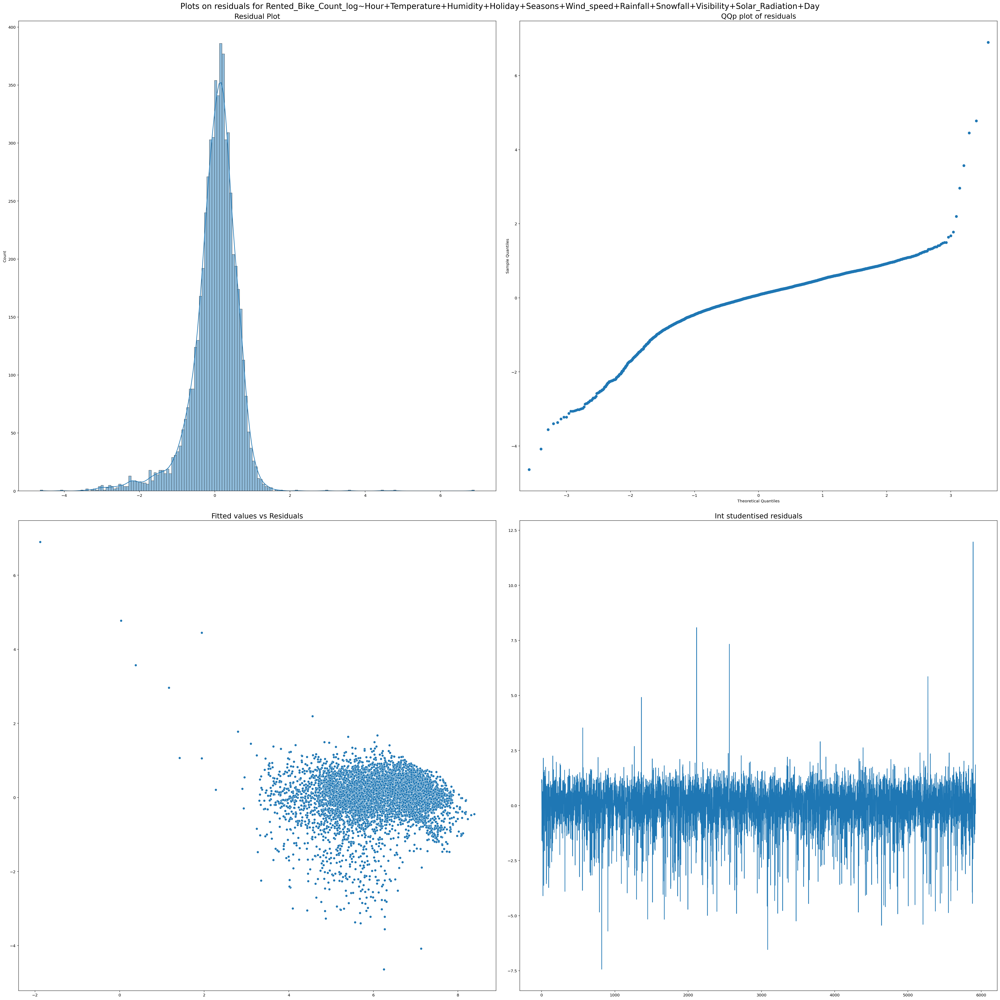

In [64]:

#residual plots check on train data
fig, axes = plt.subplots(2, 2, figsize = (35,35),constrained_layout=True)
fig.suptitle(f'Plots on residuals for {model.model.formula}',size = 20)

sns.histplot(model.resid, kde=True, ax = axes[0,0])
axes[0,0].set_title("Residual Plot", size = 18)

sm.qqplot(model.resid, ax = axes[0,1])
axes[0,1].set_title("QQp plot of residuals", size = 18)

sns.scatterplot(x = model.fittedvalues, y = model.resid, ax = axes[1,0])
axes[1,0].set_title("Fitted values vs Residuals", size = 18)

axes[1,1].plot(int_stud_resids)
axes[1,1].set_title("Int studentised residuals", size = 18)


In [65]:
#Breusch-Pagan for Heteroskedasticity

bp_test = het_breuschpagan(model.resid, model.model.exog)
labels = ['LM Statistic', 'LM-Test p-value']
print(dict(zip(labels, bp_test)))
print(bp_test[1]) # less than 0.05 implies heterscedasticty is present

{'LM Statistic': 1854.2308186755615, 'LM-Test p-value': 0.0}
0.0


In [66]:
print(bp_test[1]) # less than 0.05 implies heterscedasticty is present

0.0


In [67]:
jarque_bera(model.resid).pvalue # less than 0.05 normality is not present


0.0

In [68]:
# On train data, predictions from the model
preds_train = model.predict(df_train)

# RMSE _ train data
print(np.sqrt(mean_squared_error(y_train, preds_train)))

# Rsquared _ train data
r_squared = r2_score(y_train, preds_train)
print(r_squared)

# Rsquared _ train data
# after setting the lowest prediction to be zero, eliminating negative bike count preds
r_squared = r2_score(y_train, [i if i>=0 else 0 for i in preds_train])
print(r_squared)


0.6239543616337705
0.7117836810053839
0.7145787228975755


In [69]:
# On test data, predictions from the model
preds_test = model.predict(df_test)

# RMSE _ train data
print(np.sqrt(mean_squared_error(y_test, preds_test)))

# Rsquared _ train data
r_squared = r2_score(y_test, preds_test)
print(r_squared)

# Rsquared _ train data
# after setting the lowest prediction to be zero, eliminating negative bike count preds
r_squared = r2_score(y_test, [i if i>=0 else 0 for i in preds_test])
print(r_squared)


0.585178965685888
0.7332319132048504
0.7332319132048504


In [70]:
# ANOVA type = 2
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
Hour,1290.482518,23.0,143.120864,0.000000e+00
Holiday,31.453465,1.0,80.231914,4.395517e-19
Seasons,287.984647,3.0,244.865015,9.863425e-150
Day,81.301044,6.0,34.563963,2.830122e-41
Temperature,264.073656,1.0,673.602574,1.055673e-140
Humidity,258.827923,1.0,660.221688,4.337581e-138
Wind_speed,7.713531,1.0,19.675777,9.342850e-06
Rainfall,386.716246,1.0,986.440913,2.548949e-200
Snowfall,0.708863,1.0,1.808176,1.787790e-01
Visibility,0.001452,1.0,0.003704,9.514719e-01


In [71]:
# Insignificant predictors as per partial F test
list(anova_table[anova_table['PR(>F)']>0.05].index)

['Snowfall', 'Visibility', 'Solar_Radiation']

In [72]:
model.aic

11307.036705891136

In [73]:
model.bic

11581.201080497272

#### Trail on various combinations predictors

In [74]:
def supersetlist(items):
    l_items = list(items)
    p_list = list(chain.from_iterable(combinations(l_items, r) for r in range(len(l_items) + 1)))
    return [i for i in p_list if len(i)>0]



In [75]:
df.columns

Index(['Date', 'Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity',
       'Wind_speed', 'Visibility', 'Dew_point_temperature', 'Solar_Radiation',
       'Rainfall', 'Snowfall', 'Seasons', 'Holiday', 'Functioning_Day', 'Day',
       'Rented_Bike_Count_log'],
      dtype='object')

In [76]:
candidate_cols = ['Hour', 'Temperature', 'Humidity', \
       'Wind_speed', 'Visibility', 'Solar_Radiation', \
       'Rainfall', 'Snowfall', 'Seasons', 'Holiday','Day']

print(supersetlist(candidate_cols)[:10])

print(len(supersetlist(candidate_cols)))

[('Hour',), ('Temperature',), ('Humidity',), ('Wind_speed',), ('Visibility',), ('Solar_Radiation',), ('Rainfall',), ('Snowfall',), ('Seasons',), ('Holiday',)]
2047


In [77]:
X = df[candidate_cols]
y = df[response_col]
X_train, X_test, y_train, y_test= train_test_split(X,y, train_size=0.70, random_state=100)


df_train = pd.concat([X_train, y_train], axis=1)
df_test = pd.concat([X_test, y_test], axis=1)

In [78]:
# collecting full model mse
full_model = smf.ols('Rented_Bike_Count_log ~ ' +"+".join(candidate_cols),df_train).fit()
print(full_model.model.formula)
mse_full = full_model.mse_resid
print(mse_full)

Rented_Bike_Count_log ~ Hour+Temperature+Humidity+Wind_speed+Visibility+Solar_Radiation+Rainfall+Snowfall+Seasons+Holiday+Day
0.3920318395658907


In [85]:
model_strs = []
model_rsq_adjs = []
model_cps = []
model_vars = []
model_aics = []
model_bics = []
model_pos_rsquares_train = []
model_rsquares_test = []
model_pos_rsquares_test = []
model_rmse_test = []
model_rmse_train = []
model_no_parameters = []
model_global_ftests = []
model_ttest_ins_preds = []
model_bptest_pvalues = []
model_jbtest_pvalues = []
model_anova_ins_preds = []

for j in supersetlist(candidate_cols):
    model_str = 'Rented_Bike_Count_log ~ ' +"+".join(j)
    model_k = smf.ols(model_str,df_train).fit()
    #print(model_str, model_k.ssr, model_k.nobs, model_k.df_model+1)
    model_strs.append(model_str)
    model_rsq_adjs.append(model_k.rsquared_adj)
    model_cps.append((model_k.ssr/mse_full)-(model_k.nobs - 2*(model_k.df_model+1)))
    model_vars.append(j)
    model_aics.append(model_k.aic)
    model_bics.append(model_k.bic)
    model_pos_rsquares_train.append(r2_score(y_train, [i if i>=0 else 0 for i in model_k.predict(df_train)]))
    model_pos_rsquares_test.append(r2_score(y_test, [i if i>=0 else 0 for i in model_k.predict(df_test)]))
    model_rsquares_test.append(r2_score(y_test,model_k.predict(df_test)))
    model_rmse_test.append(np.sqrt(mean_squared_error(y_test, model_k.predict(df_test))))
    model_rmse_train.append(np.sqrt(mean_squared_error(y_train, model_k.predict(df_train)))) 
    model_no_parameters.append(model_k.df_model)
    model_global_ftests.append((model_k.fvalue,round(model_k.f_pvalue,5)))
    model_ttest_ins_preds.append([(model_k.params.index[i],round(model_k.pvalues[i],5)) for i in range(len(model_k.pvalues)) if (model_k.pvalues[i]>0.05)])
    model_bptest_pvalues.append(het_breuschpagan(model_k.resid, model_k.model.exog)[1]) # greater than 0.05 implies heterscedasticty is not present
    model_jbtest_pvalues.append(jarque_bera(model_k.resid).pvalue) # greater than 0.05 normality is present
    anova_table = sm.stats.anova_lm(model_k, typ=2)
    model_anova_ins_preds.append(list(anova_table[anova_table['PR(>F)']>0.05].index))
    

In [86]:
model_str

'Rented_Bike_Count_log ~ Hour+Temperature+Humidity+Wind_speed+Visibility+Solar_Radiation+Rainfall+Snowfall+Seasons+Holiday+Day'

In [87]:
all_models_metrics = pd.DataFrame(zip(model_strs,model_rsq_adjs,model_cps,model_vars,model_aics,model_bics,model_pos_rsquares_train,model_pos_rsquares_test,model_rsquares_test, \
                                      model_rmse_test,model_rmse_train,model_no_parameters,model_global_ftests,model_ttest_ins_preds,model_bptest_pvalues, \
                                     model_jbtest_pvalues,model_anova_ins_preds),\
            columns = ['model_eqn','adj_rsq','model_cp','predictors', 'aic','bic','model_pos_rsquares_train','model_pos_rsquares_test','model_rsquares_test', \
                       'model_rmse_test','model_rmse_train','model_no_parameters','model_global_ftests','model_ttest_ins_preds','model_bptest_pvalues', 
                       'model_jbtest_pvalues','model_anova_ins_preds'])

#all_models_metrics['no_of_predictors'] = all_models_metrics['predictors'].apply(lambda x: len(x))

all_models_metrics[:10]

,model_eqn,adj_rsq,model_cp,predictors,aic,bic,model_pos_rsquares_train,model_pos_rsquares_test,model_rsquares_test,model_rmse_test,model_rmse_train,model_no_parameters,model_global_ftests,model_ttest_ins_preds,model_bptest_pvalues,model_jbtest_pvalues,model_anova_ins_preds
0,Rented_Bike_Count_log ~ Hour,0.274612,8874.462559,"(Hour,)",16718.736389,16879.222852,0.277428,0.281528,0.281528,0.960344,0.987948,23.0,"(98.50708327686066, 0.0)","[(Hour[T.7], 0.31245), (Hour[T.10], 0.74565), ...",1.168779e-10,0.0,[]
1,Rented_Bike_Count_log ~ Temperature,0.305700,8250.904591,"(Temperature,)",16437.257769,16450.631641,0.305817,0.339013,0.339013,0.921124,0.968346,1.0,"(2609.3293232475567, 0.0)",[],4.360066e-02,0.0,[]
2,Rented_Bike_Count_log ~ Humidity,0.083308,12790.315863,"(Humidity,)",18083.619818,18096.993690,0.083463,0.063891,0.063891,1.096188,1.112676,1.0,"(539.3652335399137, 0.0)",[],8.471133e-29,0.0,[]
3,Rented_Bike_Count_log ~ Wind_speed,0.011403,14258.014562,"(Wind_speed,)",18531.044499,18544.418371,0.011570,0.007997,0.007997,1.128439,1.155491,1.0,"(69.33211983254155, 0.0)",[],4.872504e-01,0.0,[]
4,Rented_Bike_Count_log ~ Visibility,0.064602,13172.124602,"(Visibility,)",18203.303838,18216.677709,0.064760,0.058328,0.058328,1.099440,1.123971,1.0,"(410.1361224222581, 0.0)",[],6.278193e-22,0.0,[]
5,Rented_Bike_Count_log ~ Solar_Radiation,0.125072,11937.832557,"(Solar_Radiation,)",17807.335526,17820.709398,0.125220,0.124617,0.124617,1.060036,1.087034,1.0,"(847.8433191594219, 0.0)",[],5.039161e-74,0.0,[]
6,Rented_Bike_Count_log ~ Rainfall,0.066647,13130.388558,"(Rainfall,)",18190.338085,18203.711957,0.072514,0.067360,0.067360,1.094155,1.122742,1.0,"(424.01017907144626, 0.0)",[],1.848288e-194,0.0,[]
7,Rented_Bike_Count_log ~ Snowfall,0.034360,13789.425467,"(Snowfall,)",18391.833815,18405.207687,0.034523,0.036573,0.036573,1.112067,1.141996,1.0,"(211.7918293202733, 0.0)",[],4.790889e-02,0.0,[]
8,Rented_Bike_Count_log ~ Seasons,0.239459,9601.752693,"(Seasons,)",16979.174827,17005.922571,0.239844,0.275221,0.275221,0.964550,1.013316,3.0,"(622.730287208537, 0.0)",[],3.765461e-34,0.0,[]
9,Rented_Bike_Count_log ~ Holiday,0.009015,14306.755106,"(Holiday,)",18545.338533,18558.712405,0.009183,0.007582,0.007582,1.128676,1.156885,1.0,"(54.893071699548166, 0.0)",[],3.529985e-02,0.0,[]


In [88]:
#all_models_metrics.to_csv('model_trails_6.csv')

#### Influential points

**Following models are optimal based on combination of mulitple metrics like t test significant variables, Adj Rsquared, Mallows Cp, AIC, BIC**

Rented_Bike_Count_log ~ Hour+Temperature+Humidity+Wind_speed+Rainfall+Seasons+Holiday+Day


In [405]:
candidate_model_predictors = [ ['Hour', 'Temperature', 'Humidity', 'Wind_speed', 'Rainfall', 'Seasons', 'Holiday', 'Day']]

# candidate_model_predictors = [ ['Hour', 'Temperature', 'Humidity', 'Wind_speed', 'Rainfall', 'Snowfall', 'Seasons', 'Holiday', 'Functioning_Day', 'Day'], \
# ['Hour', 'Temperature', 'Humidity', 'Wind_speed', 'Rainfall', 'Seasons', 'Holiday', 'Functioning_Day', 'Day'], \
# ['Hour', 'Temperature', 'Humidity', 'Rainfall', 'Snowfall', 'Seasons', 'Holiday', 'Functioning_Day', 'Day'] ]


candidate_models = []
for j in candidate_model_predictors:
    candidate_models.append('Rented_Bike_Count_log ~ ' +"+".join(j))
    
candidate_models    

['Rented_Bike_Count_log ~ Hour+Temperature+Humidity+Wind_speed+Rainfall+Seasons+Holiday+Day']

In [406]:
#model = smf.ols('Rented_Bike_Count_log ~ Hour+Temperature+Humidity+Wind_speed+Rainfall+Seasons+Holiday+Functioning_Day',df_train).fit()

model = smf.ols(candidate_models[0],df_train).fit()
print(model.model.formula)
model.summary()

Rented_Bike_Count_log ~ Hour+Temperature+Humidity+Wind_speed+Rainfall+Seasons+Holiday+Day


<class 'statsmodels.iolib.summary.Summary'>
"""
                              OLS Regression Results                             
=================================================================================
Dep. Variable:     Rented_Bike_Count_log   R-squared:                       0.712
Model:                               OLS   Adj. R-squared:                  0.710
Method:                    Least Squares   F-statistic:                     392.7
Date:                   Sat, 15 Oct 2022   Prob (F-statistic):               0.00
Time:                           23:43:37   Log-Likelihood:                -5613.9
No. Observations:                   5925   AIC:                         1.130e+04
Df Residuals:                       5887   BIC:                         1.156e+04
Df Model:                             37                                         
Covariance Type:               nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                 6.8829      0.073     94.849      0.000       6.741       7.025
Hour[T.1]                -0.1760      0.056     -3.124      0.002      -0.286      -0.066
Hour[T.2]                -0.5001      0.056     -8.878      0.000      -0.611      -0.390
Hour[T.3]                -0.8748      0.056    -15.588      0.000      -0.985      -0.765
Hour[T.4]                -1.2701      0.057    -22.397      0.000      -1.381      -1.159
Hour[T.5]                -1.1937      0.057    -20.957      0.000      -1.305      -1.082
Hour[T.6]                -0.5420      0.055     -9.790      0.000      -0.650      -0.433
Hour[T.7]                 0.0814      0.057      1.438      0.150      -0.030       0.192
Hour[T.8]                 0.5891      0.056     10.503      0.000       0.479       0.699
Hour[T.9]                 0.1702      0.056      3.043      0.002       0.061       0.280
Hour[T.10]               -0.2082      0.056     -3.693      0.000      -0.319      -0.098
Hour[T.11]               -0.2375      0.058     -4.119      0.000      -0.350      -0.124
Hour[T.12]               -0.1421      0.057     -2.504      0.012      -0.253      -0.031
Hour[T.13]               -0.1277      0.059     -2.155      0.031      -0.244      -0.012
Hour[T.14]               -0.1990      0.059     -3.399      0.001      -0.314      -0.084
Hour[T.15]               -0.1409      0.059     -2.404      0.016      -0.256      -0.026
Hour[T.16]               -0.0368      0.058     -0.633      0.527      -0.151       0.077
Hour[T.17]                0.2048      0.058      3.542      0.000       0.091       0.318
Hour[T.18]                0.6268      0.057     10.979      0.000       0.515       0.739
Hour[T.19]                0.4203      0.057      7.314      0.000       0.308       0.533
Hour[T.20]                0.3707      0.056      6.609      0.000       0.261       0.481
Hour[T.21]                0.4232      0.056      7.566      0.000       0.314       0.533
Hour[T.22]                0.3101      0.057      5.444      0.000       0.198       0.422
Hour[T.23]                0.0862      0.056      1.550      0.121      -0.023       0.195
Seasons[T.Spring]        -0.3559      0.024    -15.042      0.000      -0.402      -0.310
Seasons[T.Summer]        -0.2922      0.031     -9.552      0.000      -0.352      -0.232
Seasons[T.Winter]        -0.8082      0.034    -23.679      0.000      -0.875      -0.741
Holiday[T.No Holiday]     0.3552      0.040      8.928      0.000       0.277       0.433
Day[T.Monday]            -0.1475      0.030     -4.848      0.000      -0.207      -0.088
Day[T.Saturday]          -0.1144      0.030     -3.772      0.000      -0.174      -0.055
Day[T.Sunday]            -0.3356      0.030    -11.082      0.000      -0.395   

In [407]:
r2_score(y_train, [i if i>=0 else 0 for i in model.predict(df_train)])

0.7144102466523348

In [408]:
# Global F test
print(model.fvalue,round(model.f_pvalue,5))

# insignificant predictors
[(model.params.index[i],round(model.pvalues[i],5)) for i in range(len(model.pvalues)) if (model.pvalues[i]>0.05)]

392.6699317160799 0.0


[('Hour[T.7]', 0.15039),
 ('Hour[T.16]', 0.52679),
 ('Hour[T.23]', 0.12128),
 ('Day[T.Thursday]', 0.2881),
 ('Day[T.Tuesday]', 0.66146),
 ('Day[T.Wednesday]', 0.80401)]

In [409]:
infl = model.get_influence()

# internal studentised residuals for autocorrelation check
int_stud_resids = infl.resid_studentized_internal

Text(0.5, 1.0, 'Int studentised residuals')

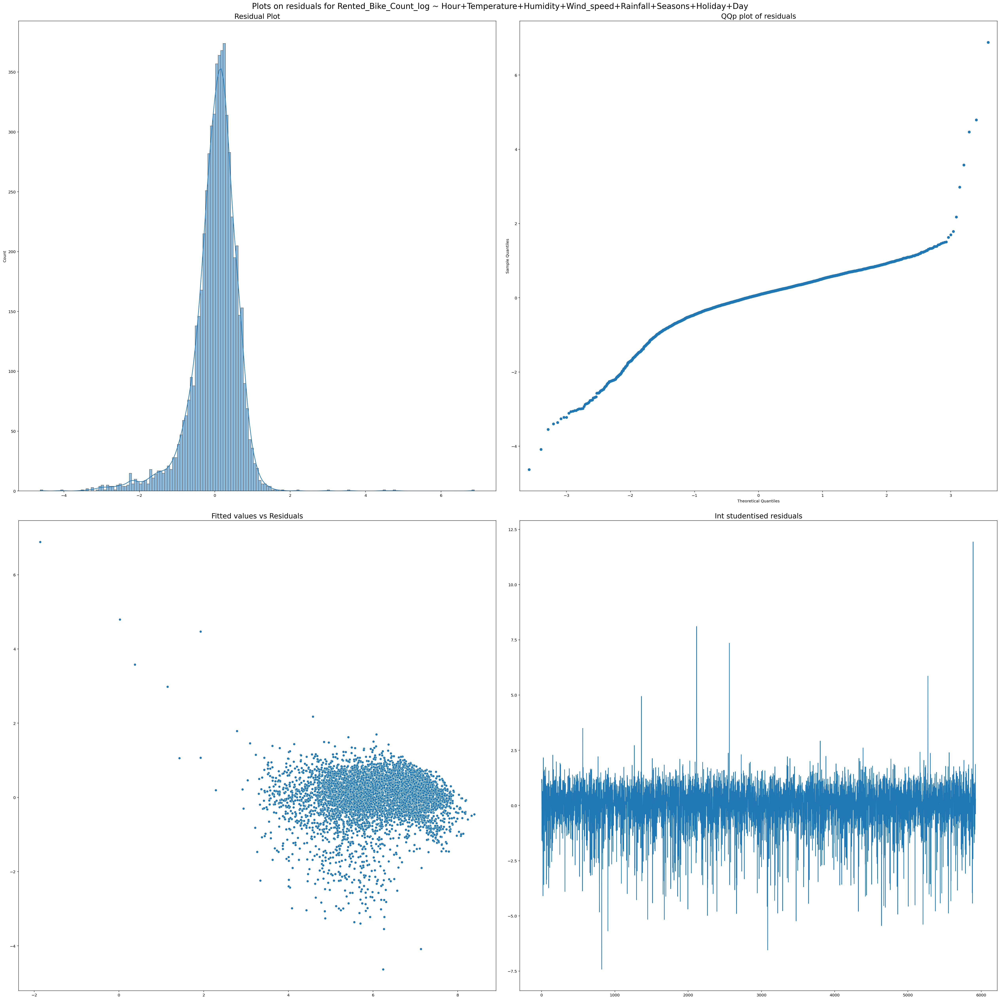

In [410]:
#residual plots check on train data
fig, axes = plt.subplots(2, 2, figsize = (35,35),constrained_layout=True)
fig.suptitle(f'Plots on residuals for {model.model.formula}',size = 20)

sns.histplot(model.resid, kde=True, ax = axes[0,0])
axes[0,0].set_title("Residual Plot", size = 18)

sm.qqplot(model.resid, ax = axes[0,1])
axes[0,1].set_title("QQp plot of residuals", size = 18)

sns.scatterplot(x = model.fittedvalues, y = model.resid, ax = axes[1,0])
axes[1,0].set_title("Fitted values vs Residuals", size = 18)

axes[1,1].plot(int_stud_resids)
axes[1,1].set_title("Int studentised residuals", size = 18)


In [411]:
#Breusch-Pagan for Heteroskedasticity
bp_test = het_breuschpagan(model.resid, model.model.exog)
print(bp_test[1]) # less than 0.05 implies heterscedasticty is present

0.0


In [412]:
jarque_bera(model.resid).pvalue # less than 0.05 normality is not present

0.0

In [413]:
# On test data, predictions from the model
preds_test = model.predict(df_test)

# RMSE _ test data
print(np.sqrt(mean_squared_error(y_test, preds_test)))

# Rsquared _ test data
r_squared = r2_score(y_test, preds_test)
print(r_squared)

# Rsquared _ test data
# after setting the lowest prediction to be zero, eliminating negative bike count preds
r_squared = r2_score(y_test, [i if i>=0 else 0 for i in preds_test])
print(r_squared)

0.5861820584189994
0.7323165608280452
0.7323165608280452


In [414]:
print(model.aic, model.bic)

11303.892590881025 11557.996157589152


#### Infl points identification

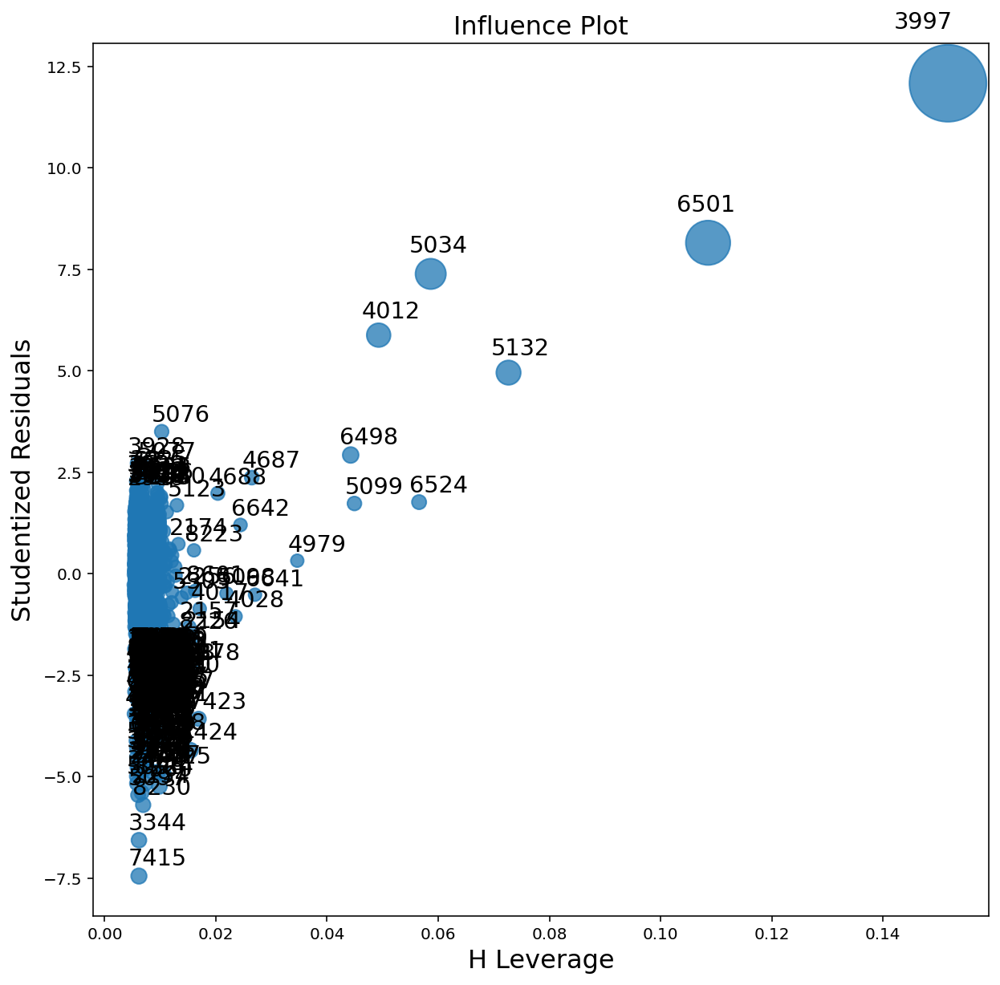

In [415]:
fig, ax = plt.subplots(figsize=(10,10))
fig=sm.graphics.influence_plot(model,ax=ax, external=True, criterion="cooks")

- There are few influential points

- Removing the influential points might help in removal of heteroscedasticity and aid in better fit

In [416]:
print(len(df_train))
print(model.df_resid)
print(model.df_model)

5925
5887.0
37.0


In [417]:
df_train['resid_studs']=infl.resid_studentized_external

In [418]:
print(max(df_train['resid_studs']), \
      len(df_train['resid_studs']), \
      np.mean(df_train['resid_studs']), \
      np.median(df_train['resid_studs']), df_train['resid_studs'][1:4])

12.081422638229405 5925 0.0001674676068526896 0.12877305035379785 3512    1.188987
6966    1.095413
1709   -0.117021
Name: resid_studs, dtype: float64


In [419]:
#get influential points - through ext student res
df_train['infl_pt_studs'] = np.abs(df_train['resid_studs']) > sp.t.ppf(0.975,df=len(df_train)-model.df_model)

In [420]:
df_train.infl_pt_studs.value_counts()

False    5644
True      281
Name: infl_pt_studs, dtype: int64

In [426]:
df_train['reg_cook'] = (infl.cooks_distance[0])


In [427]:
df_train['infl_pt_cook'] = np.abs(df_train['reg_cook']) >= 4/len(df_train)

In [428]:
df_train['infl_pt_cook'].value_counts()

False    5625
True      300
Name: infl_pt_cook, dtype: int64

In [429]:
len(df_train[(df_train['infl_pt_cook'] == False) & (df_train['infl_pt_studs'] == False)])

5614

In [430]:
df_train_infl_removed = df_train[(df_train['infl_pt_cook'] == False) & (df_train['infl_pt_studs'] == False)]
#df_train_infl_removed = df_train[(df_train['infl_pt_studs'] == False)]
print(len(df_train_infl_removed))

5614


In [431]:
len(df_train)- len(df_train_infl_removed)

311

In [432]:
(len(df_train)- len(df_train_infl_removed))/len(df_train)

0.05248945147679325

In [433]:
# temp_list= list(np.abs(df_train['resid_studs']))
# temp_list.sort(reverse=True)
# temp_list[:4]

In [434]:
# sort_index_studs = np.array(np.argsort(np.abs(df_train['resid_studs']))[::-1])
# print(type(sort_index_studs))
# sort_index_studs

In [435]:
# df_train_infl_removed = df_train.drop(df_train.iloc[sort_index_studs[0:100]].index, axis=0)

# print(len(df_train_infl_removed))
# df_train_infl_removed.head()

#### After influential point removal

In [436]:
#model = smf.ols('Rented_Bike_Count_log ~ C(Hour)+Temperature + Holiday+Seasons+Wind_speed+Rainfall+Functioning_Day',df_train_infl_removed).fit()
#model = smf.ols('Rented_Bike_Count ~ C(Hour)+Temperature + Holiday+Seasons+Wind_speed+Rainfall+Functioning_Day',df_train).fit()

model = smf.ols(candidate_models[0],df_train_infl_removed).fit()
print(model.model.formula)
model.summary()

Rented_Bike_Count_log ~ Hour+Temperature+Humidity+Wind_speed+Rainfall+Seasons+Holiday+Day


<class 'statsmodels.iolib.summary.Summary'>
"""
                              OLS Regression Results                             
=================================================================================
Dep. Variable:     Rented_Bike_Count_log   R-squared:                       0.843
Model:                               OLS   Adj. R-squared:                  0.842
Method:                    Least Squares   F-statistic:                     809.7
Date:                   Sat, 15 Oct 2022   Prob (F-statistic):               0.00
Time:                           23:46:00   Log-Likelihood:                -2926.4
No. Observations:                   5614   AIC:                             5929.
Df Residuals:                       5576   BIC:                             6181.
Df Model:                             37                                         
Covariance Type:               nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                 6.4858      0.049    131.997      0.000       6.389       6.582
Hour[T.1]                -0.1615      0.037     -4.317      0.000      -0.235      -0.088
Hour[T.2]                -0.5100      0.037    -13.619      0.000      -0.583      -0.437
Hour[T.3]                -0.8935      0.037    -23.948      0.000      -0.967      -0.820
Hour[T.4]                -1.2944      0.038    -34.263      0.000      -1.368      -1.220
Hour[T.5]                -1.2187      0.038    -32.232      0.000      -1.293      -1.145
Hour[T.6]                -0.5629      0.037    -15.288      0.000      -0.635      -0.491
Hour[T.7]                 0.1721      0.038      4.494      0.000       0.097       0.247
Hour[T.8]                 0.6784      0.038     18.017      0.000       0.605       0.752
Hour[T.9]                 0.2865      0.037      7.694      0.000       0.213       0.359
Hour[T.10]               -0.0613      0.037     -1.638      0.101      -0.135       0.012
Hour[T.11]               -0.0243      0.039     -0.630      0.529      -0.100       0.051
Hour[T.12]                0.0630      0.038      1.662      0.097      -0.011       0.137
Hour[T.13]                0.0630      0.040      1.589      0.112      -0.015       0.141
Hour[T.14]                0.0510      0.039      1.306      0.192      -0.026       0.128
Hour[T.15]                0.1095      0.039      2.793      0.005       0.033       0.186
Hour[T.16]                0.2468      0.039      6.307      0.000       0.170       0.323
Hour[T.17]                0.4735      0.039     12.176      0.000       0.397       0.550
Hour[T.18]                0.8146      0.038     21.298      0.000       0.740       0.890
Hour[T.19]                0.6077      0.038     15.837      0.000       0.532       0.683
Hour[T.20]                0.4973      0.037     13.266      0.000       0.424       0.571
Hour[T.21]                0.5212      0.037     13.977      0.000       0.448       0.594
Hour[T.22]                0.4437      0.038     11.663      0.000       0.369       0.518
Hour[T.23]                0.1687      0.037      4.559      0.000       0.096       0.241
Seasons[T.Spring]        -0.2878      0.016    -17.958      0.000      -0.319      -0.256
Seasons[T.Summer]        -0.2761      0.021    -13.362      0.000      -0.317      -0.236
Seasons[T.Winter]        -0.8790      0.023    -38.655      0.000      -0.924      -0.834
Holiday[T.No Holiday]     0.2901      0.028     10.445      0.000       0.236       0.345
Day[T.Monday]            -0.1167      0.020     -5.704      0.000      -0.157      -0.077
Day[T.Saturday]          -0.1136      0.020     -5.609      0.000      -0.153      -0.074
Day[T.Sunday]            -0.3084      0.020    -15.116      0.000      -0.348   

- Great improvement in Rsquared (train data) after influential points removal 

In [437]:
# Test data predictions

preds_test = model.predict(df_test)
preds_test.head(10)

937     4.835969
6769    6.522278
6928    7.135931
775     5.320151
3790    6.826530
3786    7.715620
5252    7.264584
4510    6.614186
6516    6.707605
522     6.037239
dtype: float64

In [438]:
# Global F test
(model.fvalue,round(model.f_pvalue,5))

(809.7494606395308, 0.0)

In [439]:
# insignificant predictors
[(model.params.index[i],round(model.pvalues[i],5)) for i in range(len(model.pvalues)) if (model.pvalues[i]>0.05)]


[('Hour[T.10]', 0.10144),
 ('Hour[T.11]', 0.52854),
 ('Hour[T.12]', 0.09664),
 ('Hour[T.13]', 0.1121),
 ('Hour[T.14]', 0.19163),
 ('Day[T.Thursday]', 0.0883),
 ('Day[T.Tuesday]', 0.20999)]

In [440]:
# getting influence infomation
infl = model.get_influence()
int_stud_resids = infl.resid_studentized_internal # internal studentised residuals for autocorrelation check

In [441]:
np.array([1,2,3]) - np.array([2,34,5])

array([ -1, -32,  -2])

In [442]:
np.array([i if i>=0 else 0 for i in model.fittedvalues])

array([5.52178659, 7.00132042, 5.97563383, ..., 5.69280669, 6.96129596,
       6.75048886])

Text(0.5, 1.0, 'Int studentised residuals')

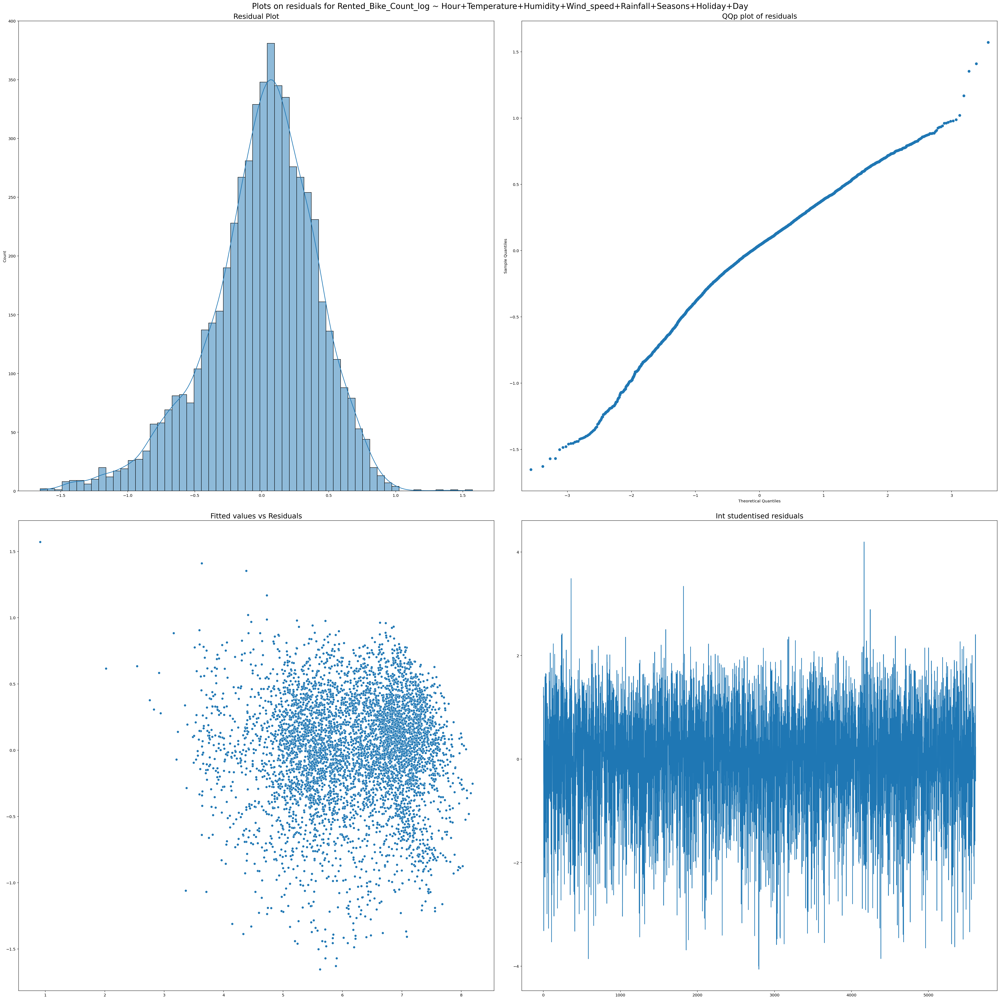

In [443]:
#residual plots check on train data
fig, axes = plt.subplots(2, 2, figsize = (35,35),constrained_layout=True)
fig.suptitle(f'Plots on residuals for {model.model.formula}',size = 20)

sns.histplot(model.resid, kde=True, ax = axes[0,0])
axes[0,0].set_title("Residual Plot", size = 18)

sm.qqplot(model.resid, ax = axes[0,1])
axes[0,1].set_title("QQp plot of residuals", size = 18)

sns.scatterplot(x = model.fittedvalues, y = model.resid, ax = axes[1,0])
#sns.scatterplot(x = np.array([i if i>=0 else 0 for i in model.fittedvalues]), y = np.array(df_train_infl_removed['Rented_Bike_Count_log']) - np.array([i if i>=0 else 0 for i in model.fittedvalues]), ax = axes[1,0])
axes[1,0].set_title("Fitted values vs Residuals", size = 18)

axes[1,1].plot(int_stud_resids)
axes[1,1].set_title("Int studentised residuals", size = 18)

In [444]:
#Breusch-Pagan for Heteroskedasticity
bp_test = het_breuschpagan(model.resid, model.model.exog)
print(bp_test[1]) # less than 0.05 implies heterscedasticty is present


1.406095993348785e-166


In [445]:
jarque_bera(model.resid).pvalue # less than 0.05 normality is not present

0.0

In [446]:
# On train data, predictions from the model
preds_train = model.predict(df_train_infl_removed)

# RMSE _ train data
print(np.sqrt(mean_squared_error(df_train_infl_removed['Rented_Bike_Count_log'], preds_train)))

# Rsquared _ train data
r_squared = r2_score(df_train_infl_removed['Rented_Bike_Count_log'], preds_train)
print(r_squared)

# Rsquared _ train data
# after setting the lowest prediction to be zero, eliminating negative bike count preds
r_squared = r2_score(df_train_infl_removed['Rented_Bike_Count_log'], [i if i>=0 else 0 for i in preds_train])
print(r_squared)


0.4075149086654602
0.8430919222689037
0.8430919222689037


In [447]:
# On test data, predictions from the model
preds_test = model.predict(df_test)

# RMSE _ train data
print(np.sqrt(mean_squared_error(y_test, preds_test)))

# Rsquared _ train data
r_squared = r2_score(y_test, preds_test)
print(r_squared)

# Rsquared _ train data
# after setting the lowest prediction to be zero, eliminating negative bike count preds
r_squared = r2_score(y_test, [i if i>=0 else 0 for i in preds_test])
print(r_squared)


0.5900861712946408
0.7287390151064849
0.7287390151064849


In [448]:
# Insignificant predictors as per partial F test
anova_table = sm.stats.anova_lm(model, typ=2)
list(anova_table[anova_table['PR(>F)']>0.05].index)


[]

In [449]:
model.aic

5928.715947076487

In [450]:
model.bic

6180.770659839517

- No insignificant variables
- Low AIC, BIC
- High Rsquared on train, Slightly Rsquared on test but that could be because test data would still some outliers, influential points over which model may not predict good
- Still has heteroscedasticity and non normality though

**Next: Since Heteroscedasticty is still there, Checking if Robust error model will have different significance in predictors**

In [451]:
model.get_robustcov_results(cov_type = "HC0").summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              OLS Regression Results                             
=================================================================================
Dep. Variable:     Rented_Bike_Count_log   R-squared:                       0.843
Model:                               OLS   Adj. R-squared:                  0.842
Method:                    Least Squares   F-statistic:                     880.6
Date:                   Sat, 15 Oct 2022   Prob (F-statistic):               0.00
Time:                           23:47:12   Log-Likelihood:                -2926.4
No. Observations:                   5614   AIC:                             5929.
Df Residuals:                       5576   BIC:                             6181.
Df Model:                             37                                         
Covariance Type:                     HC0                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                 6.4858      0.052    125.248      0.000       6.384       6.587
Hour[T.1]                -0.1615      0.034     -4.702      0.000      -0.229      -0.094
Hour[T.2]                -0.5100      0.037    -13.732      0.000      -0.583      -0.437
Hour[T.3]                -0.8935      0.037    -24.024      0.000      -0.966      -0.821
Hour[T.4]                -1.2944      0.036    -36.341      0.000      -1.364      -1.225
Hour[T.5]                -1.2187      0.033    -37.015      0.000      -1.283      -1.154
Hour[T.6]                -0.5629      0.039    -14.286      0.000      -0.640      -0.486
Hour[T.7]                 0.1721      0.046      3.726      0.000       0.082       0.263
Hour[T.8]                 0.6784      0.046     14.705      0.000       0.588       0.769
Hour[T.9]                 0.2865      0.032      8.895      0.000       0.223       0.350
Hour[T.10]               -0.0613      0.034     -1.817      0.069      -0.127       0.005
Hour[T.11]               -0.0243      0.036     -0.685      0.494      -0.094       0.045
Hour[T.12]                0.0630      0.036      1.752      0.080      -0.008       0.134
Hour[T.13]                0.0630      0.037      1.689      0.091      -0.010       0.136
Hour[T.14]                0.0510      0.039      1.321      0.187      -0.025       0.127
Hour[T.15]                0.1095      0.039      2.814      0.005       0.033       0.186
Hour[T.16]                0.2468      0.036      6.830      0.000       0.176       0.318
Hour[T.17]                0.4735      0.035     13.382      0.000       0.404       0.543
Hour[T.18]                0.8146      0.035     23.363      0.000       0.746       0.883
Hour[T.19]                0.6077      0.035     17.332      0.000       0.539       0.676
Hour[T.20]                0.4973      0.036     13.728      0.000       0.426       0.568
Hour[T.21]                0.5212      0.034     15.214      0.000       0.454       0.588
Hour[T.22]                0.4437      0.034     13.100      0.000       0.377       0.510
Hour[T.23]                0.1687      0.033      5.042      0.000       0.103       0.234
Seasons[T.Spring]        -0.2878      0.016    -18.531      0.000      -0.318      -0.257
Seasons[T.Summer]        -0.2761      0.021    -13.372      0.000      -0.317      -0.236
Seasons[T.Winter]        -0.8790      0.022    -40.410      0.000      -0.922      -0.836
Holiday[T.No Holiday]     0.2901      0.033      8.801      0.000       0.225       0.355
Day[T.Monday]            -0.1167      0.019     -6.129      0.000      -0.154      -0.079
Day[T.Saturday]          -0.1136      0.020     -5.633      0.000      -0.153      -0.074
Day[T.Sunday]            -0.3084      0.022    -14.222      0.000      -0.351   

In [452]:
# Robust error model

rob_model = model.get_robustcov_results(cov_type = "HC0")

In [453]:
# std errors see a slight change
pd.DataFrame(zip(model.bse,rob_model.bse)).head(6)

,0,1
0,0.049136,0.051783
1,0.037410,0.034342
2,0.037451,0.037143
3,0.037312,0.037193
4,0.037777,0.035618
5,0.037810,0.032924


In [454]:
# insignificant predictors
[(model.params.index[i],round(rob_model.pvalues[i],5)) for i in range(len(rob_model.pvalues)) if (rob_model.pvalues[i]>0.05)]


[('Hour[T.10]', 0.06932),
 ('Hour[T.11]', 0.49353),
 ('Hour[T.12]', 0.07988),
 ('Hour[T.13]', 0.09135),
 ('Hour[T.14]', 0.18667),
 ('Day[T.Thursday]', 0.06167),
 ('Day[T.Tuesday]', 0.14427)]

In [455]:
# insignificant predictors previously (without robust errors)
[(model.params.index[i],round(model.pvalues[i],5)) for i in range(len(model.pvalues)) if (model.pvalues[i]>0.05)]


[('Hour[T.10]', 0.10144),
 ('Hour[T.11]', 0.52854),
 ('Hour[T.12]', 0.09664),
 ('Hour[T.13]', 0.1121),
 ('Hour[T.14]', 0.19163),
 ('Day[T.Thursday]', 0.0883),
 ('Day[T.Tuesday]', 0.20999)]

#### we see that same t test significant predictors result with robust error model as the one without robust errors, so to keep it simple ignoring robust error model

In [456]:
# Test data predictions

preds_test = rob_model.predict(df_test)
preds_test.head(10)

937     4.835969
6769    6.522278
6928    7.135931
775     5.320151
3790    6.826530
3786    7.715620
5252    7.264584
4510    6.614186
6516    6.707605
522     6.037239
dtype: float64

In [457]:
#Breusch-Pagan for Heteroskedasticity
bp_test = het_breuschpagan(rob_model.resid, rob_model.model.exog)
print(bp_test[1]) # less than 0.05 implies heterscedasticty is present


1.406095993348785e-166


In [458]:
# On train data, predictions from the model
preds_train = rob_model.predict(df_train_infl_removed)

# RMSE _ train data
print(np.sqrt(mean_squared_error(df_train_infl_removed['Rented_Bike_Count_log'], preds_train)))

# Rsquared _ train data
r_squared = r2_score(df_train_infl_removed['Rented_Bike_Count_log'], preds_train)
print(r_squared)

# Rsquared _ train data
# after setting the lowest prediction to be zero, eliminating negative bike count preds
r_squared = r2_score(df_train_infl_removed['Rented_Bike_Count_log'], [i if i>=0 else 0 for i in preds_train])
print(r_squared)


0.4075149086654602
0.8430919222689037
0.8430919222689037


<AxesSubplot:>

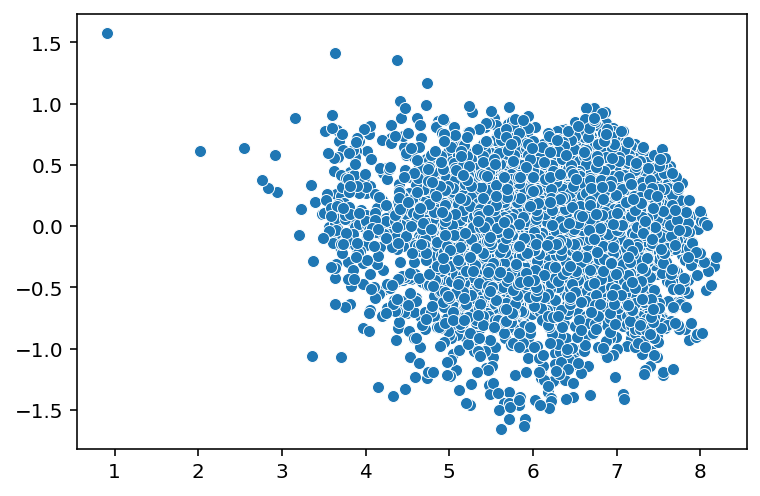

In [459]:
#sns.scatterplot(x = np.array([i if i>=0 else 0 for i in rob_model.fittedvalues]), y = np.array(df_train_infl_removed['Rented_Bike_Count_log']) - np.array([i if i>=0 else 0 for i in rob_model.fittedvalues]))
sns.scatterplot(x = rob_model.fittedvalues, y = rob_model.resid)


In [460]:
# Insignificant predictors as per partial F test
anova_table = sm.stats.anova_lm(rob_model, typ=2)
list(anova_table[anova_table['PR(>F)']>0.05].index)


[]

**Next: weight least squares might be an option to treat heteroscedasticity, trying that**

#### Weighted least squares

In [461]:
df_train_infl_removed.columns

Index(['Hour', 'Temperature', 'Humidity', 'Holiday', 'Seasons', 'Wind_speed',
       'Rainfall', 'Snowfall', 'Visibility', 'Solar_Radiation', 'Day',
       'Rented_Bike_Count_log', 'resid_studs', 'infl_pt_studs', 'reg_cook',
       'infl_pt_cook'],
      dtype='object')

In [462]:
model.model.formula

'Rented_Bike_Count_log ~ Hour+Temperature+Humidity+Wind_speed+Rainfall+Seasons+Holiday+Day'

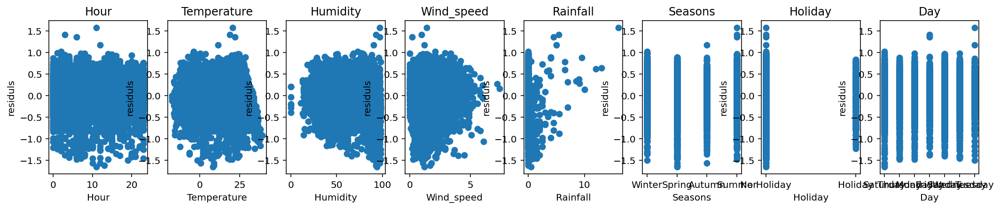

In [463]:
# weighted least squares

plt.figure(figsize=(20, 3))
for i, col in enumerate(['Hour','Temperature','Humidity','Wind_speed','Rainfall','Seasons','Holiday','Day']):
    plt.subplot(1, 9, i+1)
    x = df_train_infl_removed[col]
    y = model.resid
    plt.plot(x, y, 'o')

    plt.title(col)
    plt.xlabel(col)
    plt.ylabel('residuls')


In [464]:
df_train_infl_removed["res_sq"] = model.resid**2

/var/folders/5j/d7czpqyn59730dnppn2p0jj00000gn/T/ipykernel_3619/946679968.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train_infl_removed["res_sq"] = model.resid**2


In [465]:
model_res = smf.ols("res_sq ~ Rainfall+Wind_speed", data=df_train_infl_removed).fit()  
weight = model_res.fittedvalues
weight = abs(weight) 
df_train_infl_removed['weight'] = weight**-1 


/var/folders/5j/d7czpqyn59730dnppn2p0jj00000gn/T/ipykernel_3619/2907152756.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train_infl_removed['weight'] = weight**-1


In [466]:
#'Rented_Bike_Count_log ~ Hour+Temperature+Humidity+Wind_speed+Rainfall+Seasons+Holiday+Day'

y=df_train_infl_removed.Rented_Bike_Count_log
x=df_train_infl_removed[['Hour','Temperature','Humidity','Wind_speed','Rainfall']] 


In [467]:
mod_wls = sm.WLS(y,x, df_train_infl_removed['weight'])
mod_res = mod_wls.fit()
print(mod_res.summary())

                                  WLS Regression Results                                  
Dep. Variable:     Rented_Bike_Count_log   R-squared (uncentered):                   0.956
Model:                               WLS   Adj. R-squared (uncentered):              0.956
Method:                    Least Squares   F-statistic:                          2.415e+04
Date:                   Sat, 15 Oct 2022   Prob (F-statistic):                        0.00
Time:                           23:49:22   Log-Likelihood:                         -9577.2
No. Observations:                   5614   AIC:                                  1.916e+04
Df Residuals:                       5609   BIC:                                  1.920e+04
Df Model:                              5                                                  
Covariance Type:               nonrobust                                                  
                  coef    std err          t      P>|t|      [0.025      0.975]
----------

In [468]:
#Breusch-Pagan for Heteroskedasticity
bp_test = het_breuschpagan(mod_res.resid, mod_res.model.exog)
print(bp_test[1]) # less than 0.05 implies heterscedasticty is present


0.0


Text(0.5, 1.0, 'Fitted values vs Residuals')

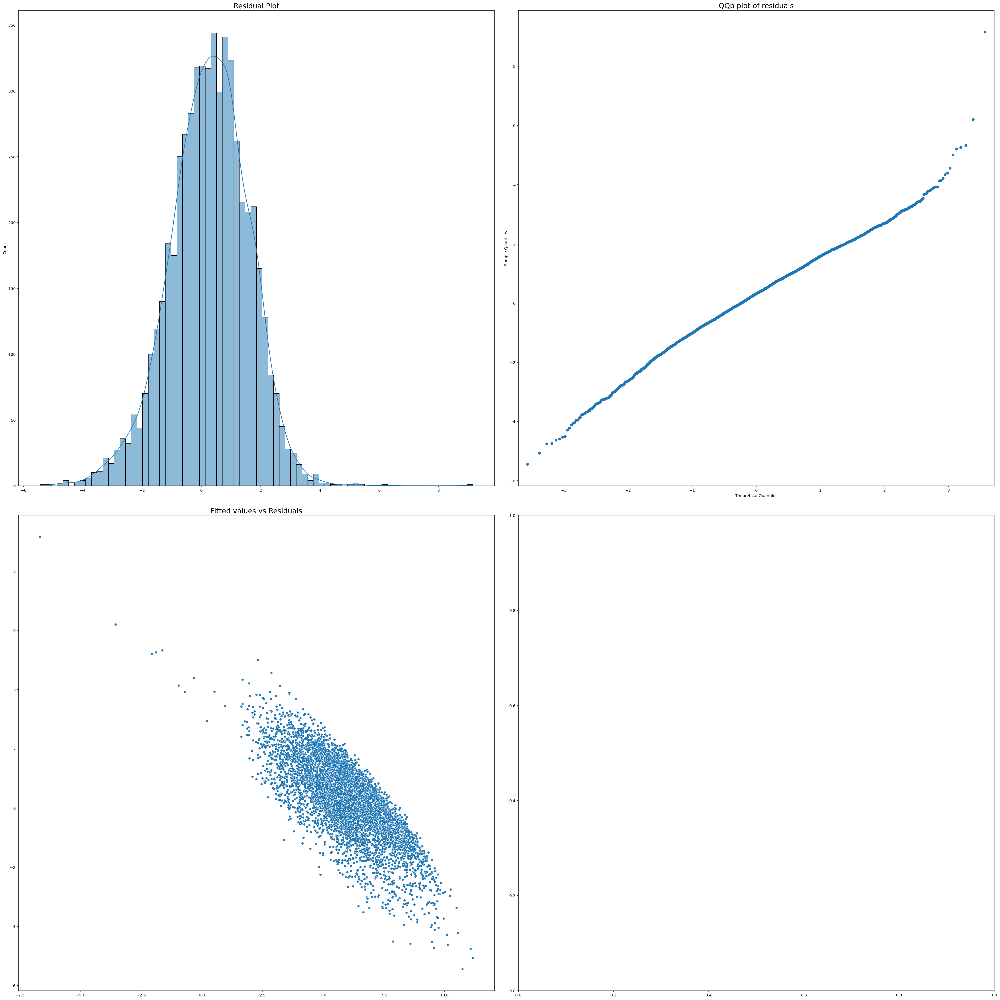

In [469]:
#residual plots check on train data
fig, axes = plt.subplots(2, 2, figsize = (35,35),constrained_layout=True)

sns.histplot(mod_res.resid, kde=True, ax = axes[0,0])
axes[0,0].set_title("Residual Plot", size = 18)

sm.qqplot(mod_res.resid, ax = axes[0,1])
axes[0,1].set_title("QQp plot of residuals", size = 18)

sns.scatterplot(x = mod_res.fittedvalues, y = mod_res.resid, ax = axes[1,0])
axes[1,0].set_title("Fitted values vs Residuals", size = 18)

As we see that heteroscedasticity is not being properly solved though weight least squares, nor is it improving normality, so ignoring weight least sqaures approach too

# **Final Model**

With all this analysis, we finally can say the final model selected is:

#### After removing influential points

In [470]:
model = smf.ols('Rented_Bike_Count_log ~ Hour+Temperature+Humidity+Wind_speed+Rainfall+Seasons+Holiday+Day',df_train_infl_removed).fit()
print(model.model.formula)
model.summary()

Rented_Bike_Count_log ~ Hour+Temperature+Humidity+Wind_speed+Rainfall+Seasons+Holiday+Day


<class 'statsmodels.iolib.summary.Summary'>
"""
                              OLS Regression Results                             
=================================================================================
Dep. Variable:     Rented_Bike_Count_log   R-squared:                       0.843
Model:                               OLS   Adj. R-squared:                  0.842
Method:                    Least Squares   F-statistic:                     809.7
Date:                   Sat, 15 Oct 2022   Prob (F-statistic):               0.00
Time:                           23:49:30   Log-Likelihood:                -2926.4
No. Observations:                   5614   AIC:                             5929.
Df Residuals:                       5576   BIC:                             6181.
Df Model:                             37                                         
Covariance Type:               nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                 6.4858      0.049    131.997      0.000       6.389       6.582
Hour[T.1]                -0.1615      0.037     -4.317      0.000      -0.235      -0.088
Hour[T.2]                -0.5100      0.037    -13.619      0.000      -0.583      -0.437
Hour[T.3]                -0.8935      0.037    -23.948      0.000      -0.967      -0.820
Hour[T.4]                -1.2944      0.038    -34.263      0.000      -1.368      -1.220
Hour[T.5]                -1.2187      0.038    -32.232      0.000      -1.293      -1.145
Hour[T.6]                -0.5629      0.037    -15.288      0.000      -0.635      -0.491
Hour[T.7]                 0.1721      0.038      4.494      0.000       0.097       0.247
Hour[T.8]                 0.6784      0.038     18.017      0.000       0.605       0.752
Hour[T.9]                 0.2865      0.037      7.694      0.000       0.213       0.359
Hour[T.10]               -0.0613      0.037     -1.638      0.101      -0.135       0.012
Hour[T.11]               -0.0243      0.039     -0.630      0.529      -0.100       0.051
Hour[T.12]                0.0630      0.038      1.662      0.097      -0.011       0.137
Hour[T.13]                0.0630      0.040      1.589      0.112      -0.015       0.141
Hour[T.14]                0.0510      0.039      1.306      0.192      -0.026       0.128
Hour[T.15]                0.1095      0.039      2.793      0.005       0.033       0.186
Hour[T.16]                0.2468      0.039      6.307      0.000       0.170       0.323
Hour[T.17]                0.4735      0.039     12.176      0.000       0.397       0.550
Hour[T.18]                0.8146      0.038     21.298      0.000       0.740       0.890
Hour[T.19]                0.6077      0.038     15.837      0.000       0.532       0.683
Hour[T.20]                0.4973      0.037     13.266      0.000       0.424       0.571
Hour[T.21]                0.5212      0.037     13.977      0.000       0.448       0.594
Hour[T.22]                0.4437      0.038     11.663      0.000       0.369       0.518
Hour[T.23]                0.1687      0.037      4.559      0.000       0.096       0.241
Seasons[T.Spring]        -0.2878      0.016    -17.958      0.000      -0.319      -0.256
Seasons[T.Summer]        -0.2761      0.021    -13.362      0.000      -0.317      -0.236
Seasons[T.Winter]        -0.8790      0.023    -38.655      0.000      -0.924      -0.834
Holiday[T.No Holiday]     0.2901      0.028     10.445      0.000       0.236       0.345
Day[T.Monday]            -0.1167      0.020     -5.704      0.000      -0.157      -0.077
Day[T.Saturday]          -0.1136      0.020     -5.609      0.000      -0.153      -0.074
Day[T.Sunday]            -0.3084      0.020    -15.116      0.000      -0.348   

In [471]:
# On test data, predictions from the model
preds_test = model.predict(df_test)

# RMSE _ test data
print(f'Test data RMSE is: {np.sqrt(mean_squared_error(y_test, preds_test))}')

# Rsquared _ test data
r_squared = r2_score(y_test, preds_test)
print(f'Test data Rsquared is {r_squared}')

# Rsquared _ test data
# after setting the lowest prediction to be zero, eliminating negative bike count preds
r_squared = r2_score(y_test, [i if i>=0 else 0 for i in preds_test])
print(f'Test data Rsquared (adjusting for negative predictions) is {r_squared}')

Test data RMSE is: 0.5900861712946408
Test data Rsquared is 0.7287390151064849
Test data Rsquared (adjusting for negative predictions) is 0.7287390151064849


In [472]:
# On train data, predictions from the model
preds_train = model.predict(df_train_infl_removed)

# RMSE _ train data
print(f"Train data RMSE is: {np.sqrt(mean_squared_error(df_train_infl_removed['Rented_Bike_Count_log'], preds_train))}")

# Rsquared _ train data
r_squared = r2_score(df_train_infl_removed['Rented_Bike_Count_log'], preds_train)
print(f'Train data Rsquared is {r_squared}')

# Rsquared _ train data
# after setting the lowest prediction to be zero, eliminating negative bike count preds
r_squared = r2_score(df_train_infl_removed['Rented_Bike_Count_log'], [i if i>=0 else 0 for i in preds_train])
print(f'Train data Rsquared (adjusting for negative predictions) is {r_squared}')

Train data RMSE is: 0.4075149086654602
Train data Rsquared is 0.8430919222689037
Train data Rsquared (adjusting for negative predictions) is 0.8430919222689037


In [473]:
print(f'Model AIC is {model.aic}')
print(f'Model BIC is {model.bic}')

Model AIC is 5928.715947076487
Model BIC is 6180.770659839517


In [474]:
# Global F test
(model.fvalue,round(model.f_pvalue,5))

(809.7494606395308, 0.0)

In [475]:
# insignificant predictors from t test
[(model.params.index[i],round(model.pvalues[i],5)) for i in range(len(model.pvalues)) if (model.pvalues[i]>0.05)]

[('Hour[T.10]', 0.10144),
 ('Hour[T.11]', 0.52854),
 ('Hour[T.12]', 0.09664),
 ('Hour[T.13]', 0.1121),
 ('Hour[T.14]', 0.19163),
 ('Day[T.Thursday]', 0.0883),
 ('Day[T.Tuesday]', 0.20999)]

- Not all hour or Day variants are insiginificant, so hour and Day are still significant, i.e there are no insignificant variables

In [476]:
#Breusch-Pagan for Heteroskedasticity
bp_test = het_breuschpagan(model.resid, model.model.exog)
print(bp_test[1]) # less than 0.05 implies heterscedasticty is present

print(jarque_bera(model.resid).pvalue) # less than 0.05 normality is not present

1.406095993348785e-166
0.0


In [477]:
model.params

Intercept                6.485758
Hour[T.1]               -0.161492
Hour[T.2]               -0.510037
Hour[T.3]               -0.893530
Hour[T.4]               -1.294374
Hour[T.5]               -1.218673
Hour[T.6]               -0.562896
Hour[T.7]                0.172111
Hour[T.8]                0.678371
Hour[T.9]                0.286452
Hour[T.10]              -0.061325
Hour[T.11]              -0.024319
Hour[T.12]               0.063031
Hour[T.13]               0.063046
Hour[T.14]               0.051004
Hour[T.15]               0.109512
Hour[T.16]               0.246770
Hour[T.17]               0.473531
Hour[T.18]               0.814598
Hour[T.19]               0.607684
Hour[T.20]               0.497303
Hour[T.21]               0.521245
Hour[T.22]               0.443670
Hour[T.23]               0.168740
Seasons[T.Spring]       -0.287785
Seasons[T.Summer]       -0.276061
Seasons[T.Winter]       -0.878985
Holiday[T.No Holiday]    0.290065
Day[T.Monday]           -0.116718
Day[T.Saturday

- Some heteroscedasticity and non normality still exist in the model. 
- As we can see above in this notebook, tried multiple ways to deal with this : transformations on response, predictors, scaling on predictors, influential points removal, robust errors, Weighted least sqaures approach, none could remove heteroscedasticity completely. 

- The ones which helped in better fit, leading to the final model we see above, are :
-- Transformation on response :Log transformed the rented bike count
-- Influential point removal
-- Picking the model with optimal combination of significant variables from t test, better Adj Rsqaured, better Mallows Cp, better AIC, better BIC


**Final model without influential points removed:**

In [478]:
model = smf.ols('Rented_Bike_Count_log ~ Hour+Temperature+Humidity+Wind_speed+Rainfall+Seasons+Holiday+Day',df_train).fit()
print(model.model.formula)
model.summary()

Rented_Bike_Count_log ~ Hour+Temperature+Humidity+Wind_speed+Rainfall+Seasons+Holiday+Day


<class 'statsmodels.iolib.summary.Summary'>
"""
                              OLS Regression Results                             
=================================================================================
Dep. Variable:     Rented_Bike_Count_log   R-squared:                       0.712
Model:                               OLS   Adj. R-squared:                  0.710
Method:                    Least Squares   F-statistic:                     392.7
Date:                   Sat, 15 Oct 2022   Prob (F-statistic):               0.00
Time:                           23:50:11   Log-Likelihood:                -5613.9
No. Observations:                   5925   AIC:                         1.130e+04
Df Residuals:                       5887   BIC:                         1.156e+04
Df Model:                             37                                         
Covariance Type:               nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                 6.8829      0.073     94.849      0.000       6.741       7.025
Hour[T.1]                -0.1760      0.056     -3.124      0.002      -0.286      -0.066
Hour[T.2]                -0.5001      0.056     -8.878      0.000      -0.611      -0.390
Hour[T.3]                -0.8748      0.056    -15.588      0.000      -0.985      -0.765
Hour[T.4]                -1.2701      0.057    -22.397      0.000      -1.381      -1.159
Hour[T.5]                -1.1937      0.057    -20.957      0.000      -1.305      -1.082
Hour[T.6]                -0.5420      0.055     -9.790      0.000      -0.650      -0.433
Hour[T.7]                 0.0814      0.057      1.438      0.150      -0.030       0.192
Hour[T.8]                 0.5891      0.056     10.503      0.000       0.479       0.699
Hour[T.9]                 0.1702      0.056      3.043      0.002       0.061       0.280
Hour[T.10]               -0.2082      0.056     -3.693      0.000      -0.319      -0.098
Hour[T.11]               -0.2375      0.058     -4.119      0.000      -0.350      -0.124
Hour[T.12]               -0.1421      0.057     -2.504      0.012      -0.253      -0.031
Hour[T.13]               -0.1277      0.059     -2.155      0.031      -0.244      -0.012
Hour[T.14]               -0.1990      0.059     -3.399      0.001      -0.314      -0.084
Hour[T.15]               -0.1409      0.059     -2.404      0.016      -0.256      -0.026
Hour[T.16]               -0.0368      0.058     -0.633      0.527      -0.151       0.077
Hour[T.17]                0.2048      0.058      3.542      0.000       0.091       0.318
Hour[T.18]                0.6268      0.057     10.979      0.000       0.515       0.739
Hour[T.19]                0.4203      0.057      7.314      0.000       0.308       0.533
Hour[T.20]                0.3707      0.056      6.609      0.000       0.261       0.481
Hour[T.21]                0.4232      0.056      7.566      0.000       0.314       0.533
Hour[T.22]                0.3101      0.057      5.444      0.000       0.198       0.422
Hour[T.23]                0.0862      0.056      1.550      0.121      -0.023       0.195
Seasons[T.Spring]        -0.3559      0.024    -15.042      0.000      -0.402      -0.310
Seasons[T.Summer]        -0.2922      0.031     -9.552      0.000      -0.352      -0.232
Seasons[T.Winter]        -0.8082      0.034    -23.679      0.000      -0.875      -0.741
Holiday[T.No Holiday]     0.3552      0.040      8.928      0.000       0.277       0.433
Day[T.Monday]            -0.1475      0.030     -4.848      0.000      -0.207      -0.088
Day[T.Saturday]          -0.1144      0.030     -3.772      0.000      -0.174      -0.055
Day[T.Sunday]            -0.3356      0.030    -11.082      0.000      -0.395   

In [479]:
# On test data, predictions from the model
preds_test = model.predict(df_test)

# RMSE _ test data
print(f'Test data RMSE is: {np.sqrt(mean_squared_error(y_test, preds_test))}')

# Rsquared _ test data
r_squared = r2_score(y_test, preds_test)
print(f'Test data Rsquared is {r_squared}')

# Rsquared _ test data
# after setting the lowest prediction to be zero, eliminating negative bike count preds
r_squared = r2_score(y_test, [i if i>=0 else 0 for i in preds_test])
print(f'Test data Rsquared (adjusting for negative predictions) is {r_squared}')

Test data RMSE is: 0.5861820584189994
Test data Rsquared is 0.7323165608280452
Test data Rsquared (adjusting for negative predictions) is 0.7323165608280452


In [480]:
# On train data, predictions from the model
preds_train = model.predict(df_train)

# RMSE _ train data
print(f"Train data RMSE is: {np.sqrt(mean_squared_error(df_train['Rented_Bike_Count_log'], preds_train))}")

# Rsquared _ train data
r_squared = r2_score(df_train['Rented_Bike_Count_log'], preds_train)
print(f'Train data Rsquared is {r_squared}')

# Rsquared _ train data
# after setting the lowest prediction to be zero, eliminating negative bike count preds
r_squared = r2_score(df_train['Rented_Bike_Count_log'], [i if i>=0 else 0 for i in preds_train])
print(f'Train data Rsquared (adjusting for negative predictions) is {r_squared}')

Train data RMSE is: 0.6241047545991415
Train data Rsquared is 0.7116447255515923
Train data Rsquared (adjusting for negative predictions) is 0.7144102466523348


In [481]:
print(f'Model AIC is {model.aic}')
print(f'Model BIC is {model.bic}')

Model AIC is 11303.892590881025
Model BIC is 11557.996157589152


In [482]:
# Global F test
(model.fvalue,round(model.f_pvalue,5))

(392.6699317160799, 0.0)

In [483]:
# insignificant predictors from t test
[(model.params.index[i],round(model.pvalues[i],5)) for i in range(len(model.pvalues)) if (model.pvalues[i]>0.05)]

[('Hour[T.7]', 0.15039),
 ('Hour[T.16]', 0.52679),
 ('Hour[T.23]', 0.12128),
 ('Day[T.Thursday]', 0.2881),
 ('Day[T.Tuesday]', 0.66146),
 ('Day[T.Wednesday]', 0.80401)]

- Not all hour or Day variants are insiginificant, so hour and Day are still significant, i.e there are no insignificant variables

In [484]:
#Breusch-Pagan for Heteroskedasticity
bp_test = het_breuschpagan(model.resid, model.model.exog)
print(bp_test[1]) # less than 0.05 implies heterscedasticty is present

print(jarque_bera(model.resid).pvalue) # less than 0.05 normality is not present

0.0
0.0


Heteroscedasticty and non normality still present

In [485]:
model.params

Intercept                6.882877
Hour[T.1]               -0.175991
Hour[T.2]               -0.500126
Hour[T.3]               -0.874847
Hour[T.4]               -1.270123
Hour[T.5]               -1.193658
Hour[T.6]               -0.541967
Hour[T.7]                0.081381
Hour[T.8]                0.589094
Hour[T.9]                0.170175
Hour[T.10]              -0.208163
Hour[T.11]              -0.237464
Hour[T.12]              -0.142090
Hour[T.13]              -0.127728
Hour[T.14]              -0.199000
Hour[T.15]              -0.140866
Hour[T.16]              -0.036751
Hour[T.17]               0.204838
Hour[T.18]               0.626833
Hour[T.19]               0.420255
Hour[T.20]               0.370678
Hour[T.21]               0.423191
Hour[T.22]               0.310129
Hour[T.23]               0.086241
Seasons[T.Spring]       -0.355892
Seasons[T.Summer]       -0.292249
Seasons[T.Winter]       -0.808206
Holiday[T.No Holiday]    0.355207
Day[T.Monday]           -0.147452
Day[T.Saturday